# Assignment 2: Classification
# Using Machine Learning Tools

## Overview

In this assignment, you will apply some popular machine learning techniques to the problem of classifying data from histological cell images for the diagnosis of malignant breast cancer. This will be presented as a practical scenario where you are approached by a client to solve a problem.  

The main aims of this assignment are: 

- to use the best practice machine learning workflow for producing a solution to a client's problem;
- to visualise data and determine the best pre-processing;
- to create the necessary datasets for training and testing purposes;
- to train and optimise a selection of models, then choose the best;
- to obtain an unbiased measurement of the final model's performance;
- to interpret results clearly and concisely.

This assignment relates to the following ACS CBOK areas: abstraction, design, hardware and software, data and information, HCI and programming.

## General instructions

This assignment is divided into several tasks. Use the spaces provided in this notebook to answer the questions posed in each task. Note that some questions require writing a small amount of code, some require graphical results, and some require comments or analysis as text. It is your responsibility to make sure your responses are clearly labelled and your code has been fully executed (**with the correct results displayed**) before submission!

**Do not** manually edit the data set file we have provided! For marking purposes, it's important that your code runs correctly on the original data file.

Some of the parts of this assignment build on the workflow from the first assignment and that part of the course, and so less detailed instructions are provided for this, as you should be able to implement this workflow now without low-level guidance. A substantial portion of the marks for this assignment are associated with making the right choices and executing this workflow correctly and efficiently. Make sure you have clean, readable code as well as producing outputs, since your coding will also count towards the marks (however, excessive commenting is discouraged and will lose marks, so aim for a modest, well-chosen amount of comments and text in outputs).

This assignment can be solved using methods from [sklearn](https://scikit-learn.org/stable/index.html), [pandas](https://pandas.pydata.org/pandas-docs/stable/index.html), and [matplotlib](https://matplotlib.org/stable/index.html) as presented in the workshops. Other libraries should not be used (even though they might have nice functionality) and certain restrictions on sklearn functions will be made clear in the instruction text. You are expected to search and carefully read the documentation for functions that you use, to ensure you are using them correctly.

# Scenario

A client approaches you to solve a machine learning problem for them.  They run a pathology lab that processes histological images for healthcare providers and they have created a product that measures the same features as in the *Wisconsin breast cancer data set* though using different acquisitions and processing methods. This makes their method much faster than existing ones, but it is also slightly noisier. They want to be able to diagnose *malignant* cancer (and distinguish them from *benign* growths) by employing machine learning techniques, and they have asked you to implement this for them.

Their requirements are:
 1) have at least a 95% probability of detecting malignant cancer when it is present;
 2) have no more than 1 in 10 healthy cases (those with benign tumours) labelled as positive (malignant).
 
They have hand-labelled 300 samples for you, which is all they have at the moment.

Please follow the instructions below, which will vary in level of detail, as appropriate to the marks given.

## 1. Investigate Dataset (10% = 3 marks)

In [1]:
# This code imports some libraries that you will need. 
# You should not need to modify it, though you are expected to make other imports later in your code.

# Python ≥3.5 is required
import sys
assert sys.version_info >= (3, 5)

from pprint import pprint

from numpy.random import default_rng
from sklearn.impute import SimpleImputer
from sklearn.linear_model import SGDClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVR, SVC
from sklearn.tree import DecisionTreeClassifier

# Common imports
import numpy as np
import time

# Pandas for overview
import pandas as pd

# Scikit-Learn ≥0.20 is required
import sklearn
assert sklearn.__version__ >= "0.20"
from sklearn import tree
from sklearn import svm
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV, train_test_split, RandomizedSearchCV
from sklearn.metrics import confusion_matrix, accuracy_score, balanced_accuracy_score, recall_score, precision_score, \
    roc_auc_score, f1_score, roc_curve, precision_recall_curve, hinge_loss, auc


# Plot setup
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rc('axes', labelsize=7)
mpl.rc('xtick', labelsize=6)
mpl.rc('ytick', labelsize=6)
mpl.rc('figure', dpi=240)
plt.close('all')

import seaborn as sns
from IPython.display import display, Image

import urllib.request
from IPython.display import Image

def display_tool(x):
    image_url = x
    filename = "display.jpg"
    
    req = urllib.request.build_opener()
    req.addheaders = [('User-Agent', 'Mozilla/5.0 (Macintosh; Intel Mac OS X 10_11_6) AppleWebKit/605.1.15 (KHTML, like Gecko) Version/11.1.2 Safari/605.1.15')]
    urllib.request.install_opener(req)
    
    urllib.request.urlretrieve(image_url, filename)

    return Image(filename="display.jpg")

### 1.1 Load the dataset [0.5 marks]
Do this from the csv file, `assignment2.csv`, as done in assignment 1 and workshops 2 and 3. Extract the feature names and label names for use later on.  Note that we will be treating the _malignant_ case as our _positive_ case, as this is the standard convention in medicine.

**Print out some information (in text) about the data, to verify that the loading has worked and to get a feeling for what is present in the dataset and the range of the values.**

**Also, graphically show the proportions of the labels in the whole dataset.**

In [2]:
# Your code here
data = pd.read_csv('assignment2.csv')
data.describe()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
count,300.000000,300.000000,300.000000,300.000000,300.000000,300.000000,300.000000,300.000000,300.000000,300.000000,...,300.000000,300.000000,300.000000,300.000000,300.000000,300.000000,300.000000,300.000000,300.000000,300.000000
mean,14.231808,19.312619,92.727687,664.367372,0.096937,0.106615,0.092591,0.050820,0.182546,0.062841,...,16.460566,25.772128,108.563914,900.644633,0.133424,0.261732,0.282075,0.118146,0.293620,0.084556
std,1.297393,1.572224,8.949937,129.515717,0.005067,0.020819,0.030312,0.014350,0.010754,0.002736,...,1.798202,2.346310,12.500033,209.738842,0.008678,0.063535,0.079831,0.024552,0.025620,0.007427
min,11.560025,15.349270,74.690886,477.371592,0.084651,0.075184,0.050771,0.028701,0.157059,0.057830,...,13.279265,20.144214,87.110184,633.771881,0.110342,0.167098,0.152272,0.066927,0.240341,0.072745
25%,13.356676,18.194791,86.659535,580.383274,0.093305,0.091105,0.069071,0.039507,0.175353,0.060950,...,15.148044,24.058893,99.229249,752.124790,0.127682,0.215767,0.219671,0.098389,0.277676,0.079636
50%,13.976933,19.220652,90.896982,628.004851,0.096722,0.102401,0.084829,0.046744,0.181685,0.062477,...,16.007171,25.689861,105.540619,828.667704,0.133064,0.247022,0.267894,0.115679,0.288994,0.082610
75%,15.103078,20.245660,99.093762,737.444716,0.099995,0.117334,0.107994,0.060606,0.187789,0.064149,...,17.656889,27.333610,116.274995,1011.628413,0.138650,0.298732,0.325278,0.136687,0.305227,0.087645
max,19.090091,26.836291,126.168030,1300.788708,0.114500,0.192880,0.212704,0.105212,0.226448,0.076091,...,22.676185,34.614459,150.353232,1796.820974,0.164583,0.543118,0.635074,0.179794,0.432297,0.128288


In [3]:
print('feature_names')
features = data.columns[1:].tolist()
print(features)

feature_names
['mean radius', 'mean texture', 'mean perimeter', 'mean area', 'mean smoothness', 'mean compactness', 'mean concavity', 'mean concave points', 'mean symmetry', 'mean fractal dimension', 'radius error', 'texture error', 'perimeter error', 'area error', 'smoothness error', 'compactness error', 'concavity error', 'concave points error', 'symmetry error', 'fractal dimension error', 'worst radius', 'worst texture', 'worst perimeter', 'worst area', 'worst smoothness', 'worst compactness', 'worst concavity', 'worst concave points', 'worst symmetry', 'worst fractal dimension']


label_names: ['benign', 'malignant']
label_counts: label
benign       154
malignant    146
dtype: int64


<AxesSubplot:xlabel='label', ylabel='count'>

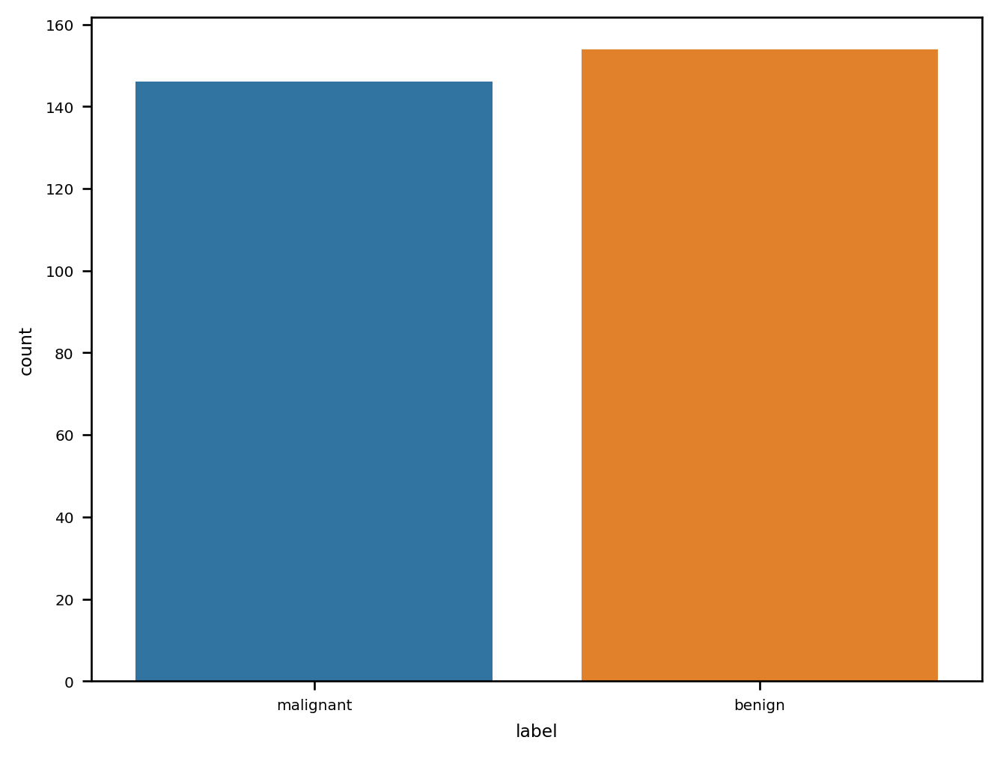

In [4]:
labels = data.groupby('label').size().index.tolist()
print(f'label_names: {labels}')
print(f'label_counts: {data.groupby("label").size()}')
sns.countplot(x=data['label'])

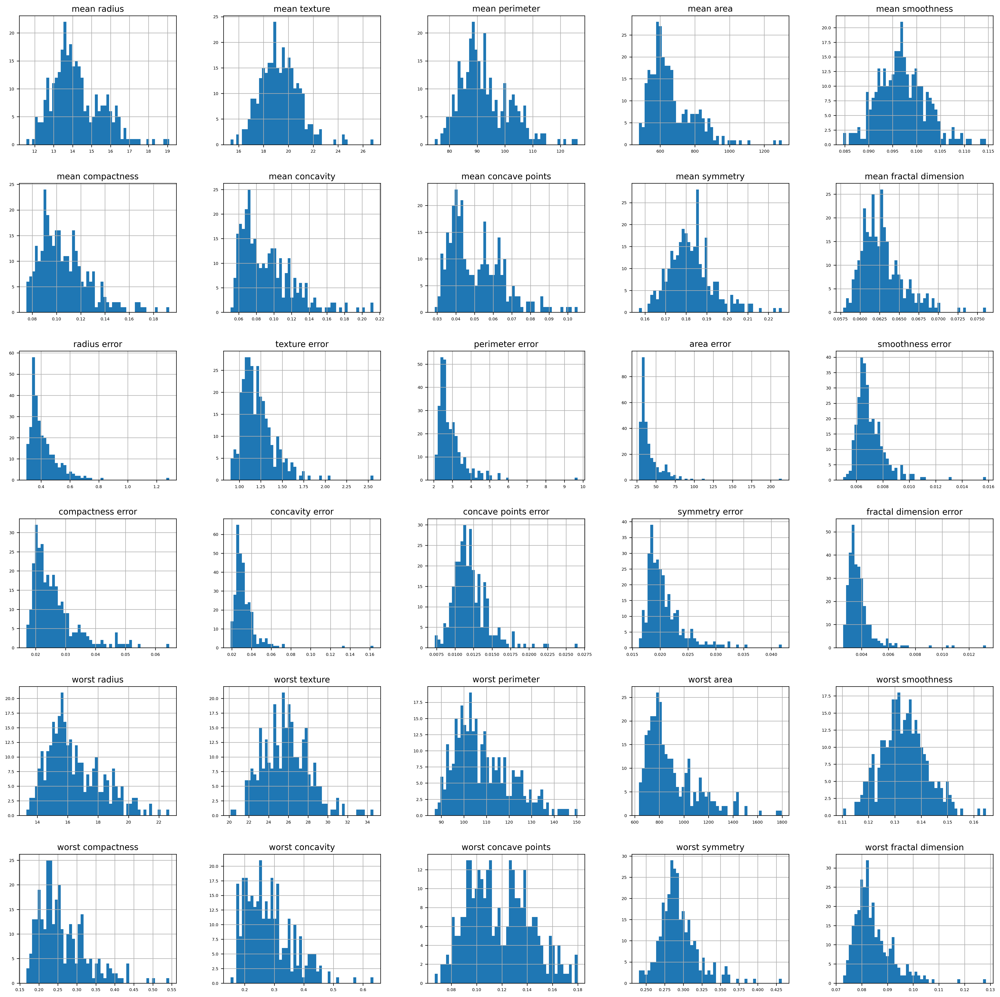

In [5]:
data.hist(bins=50,figsize=(25,25))
plt.show()

### 1.2 Visualise the dataset [1.5 marks]

As this data is well curated by the client already, you do not need to worry about outliers, missing values or imputation in this case, but be aware that this is the exception, not the rule.

To familiarise yourself with the nature and information contained in the data, display histograms for the data according to the following instructions:
 - **display histograms** for each feature in the _mean_ group, but on _each_ histogram **have the two classes displayed together in one plot** (see example plot below and a code fragment to help you) - and note that your plot does not need to look exactly the example here;
 - **repeat this** for the _standard error_ and _worst_ groups;
 - make sure that in all cases you clearly label the plots and the classes in histograms.

<center><img src="Example_Hist_Plot.png" width="300" alt="Example plot of histogram"></center>

In [6]:
# Code fragment to help with plotting histograms combining matplotlib and seaborn (and pandas)

def histograms_plot(features, rows, cols):

    fig, axes = plt.subplots(rows, cols, figsize=(40, 20))

    for row in range(rows):
        for col in range(cols):
            feature = features[row*cols + col]
            sns.histplot(data=data, x=feature, hue="label", bins='auto', kde=True, ax=axes[row,col], edgecolor=None)

    plt.show()

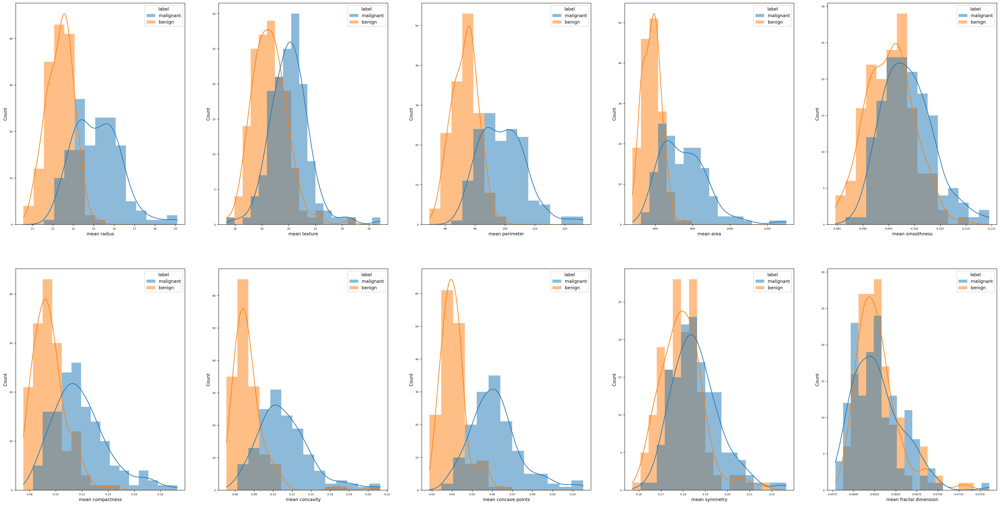

In [7]:
# Your code here
histograms_plot(features[0:10],2,5)

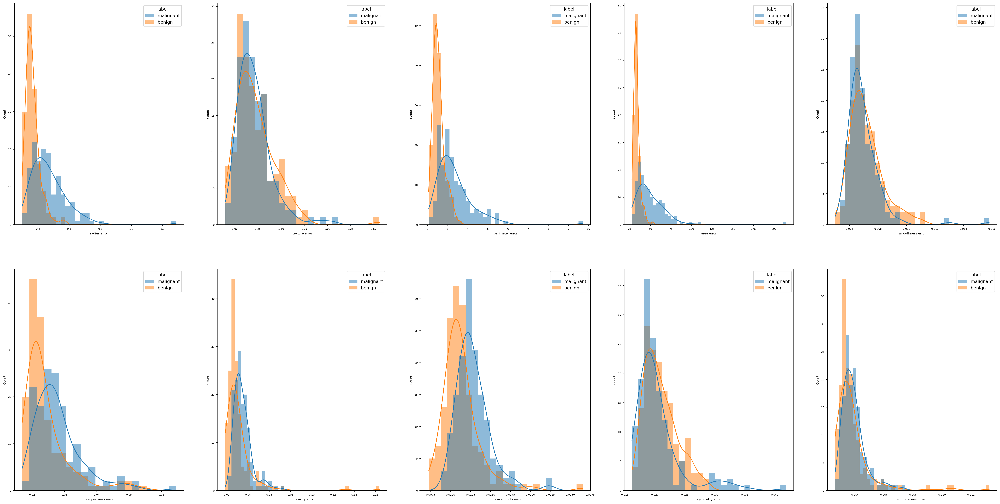

In [7]:
histograms_plot(features[10:20],2,5)

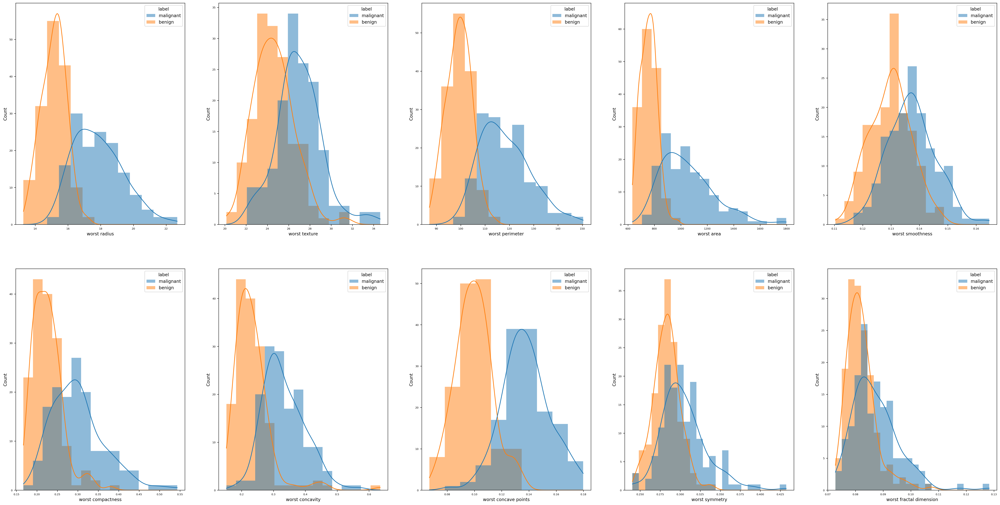

In [9]:
histograms_plot(features[20:30],2,5)

### 1.3 Ranking the features [0.5 marks]

**Based on the histograms, which do you think are the 3 strongest features for discriminating between the classes?**

In [8]:
# Your answer here
data['label'].replace(['malignant','benign'],[1,0],inplace=True)
corr = data.corr()['label'].sort_values(ascending=False)
print(corr[corr >= 0.6])
#3 features are worst radius, worst perimeter and worst concave points.

label                   1.000000
worst concave points    0.778575
worst perimeter         0.764033
worst radius            0.755703
mean concave points     0.729886
mean perimeter          0.710967
worst area              0.705986
mean radius             0.698323
mean area               0.664719
mean concavity          0.623550
worst concavity         0.622537
Name: label, dtype: float64


### 1.4 Splitting the dataset [0.5 marks]

Split the dataset into appropriate subsets. You must choose what the subsets are and how big they are. However, we want to make sure the proportion of the two classes is consistent across all datasets, so use the _stratify_ option, as used in workshops 5 and 6. Verify the size and label distribution in each dataset.

In [9]:
# Your code here
data.shape

(300, 31)

In [10]:
bigtrain_set, test_set = train_test_split(data, test_size=0.2, random_state=42, stratify=data['label'])
train_set, val_set = train_test_split(bigtrain_set, test_size=0.2, random_state=42, stratify=bigtrain_set['label'])
data.head()

,label,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
0,1,15.494654,15.902542,103.008265,776.437239,0.104239,0.168660,0.170572,0.085668,0.205053,...,19.522957,22.427276,135.128520,1286.903131,0.142725,0.407483,0.445992,0.171662,0.353211,0.097731
1,1,16.229871,18.785613,105.176755,874.712003,0.091843,0.092548,0.081681,0.053670,0.180435,...,19.140235,24.905156,123.886045,1234.499997,0.129135,0.223918,0.248846,0.136735,0.284427,0.085758
2,1,16.345671,20.114076,107.083804,872.563251,0.099924,0.123799,0.128788,0.078310,0.189756,...,19.144816,25.601433,125.113036,1202.749973,0.135017,0.314402,0.332505,0.161497,0.313038,0.084340
3,1,13.001009,19.876997,85.889775,541.281012,0.113423,0.173069,0.146214,0.069574,0.212078,...,15.565911,26.145119,102.958265,737.655082,0.161390,0.485912,0.430007,0.167254,0.432297,0.117705
4,1,16.416060,17.397533,107.857386,891.516818,0.097321,0.111530,0.125971,0.068575,0.179562,...,18.620376,22.306233,124.002529,1139.490971,0.133950,0.230996,0.316620,0.131715,0.269591,0.080497


In [11]:
x_train = train_set.drop("label",axis=1)
y_train = train_set["label"].copy()
x_test = test_set.drop("label",axis=1)
y_test = test_set["label"].copy()
x_val = val_set.drop("label",axis=1)
y_val = val_set["label"].copy()

print(f'Shapes are {[x_train.shape,y_train.shape,x_test.shape,y_test.shape,x_val.shape,y_val.shape]}')
print(np.mean(y_train),np.mean(y_test),np.mean(y_val))

Shapes are [(192, 30), (192,), (60, 30), (60,), (48, 30), (48,)]
0.4895833333333333 0.48333333333333334 0.4791666666666667


## 2. Build, Train and Optimise Classifiers (60% = 18 marks)

### 2.1 Pipeline [0.5 marks]
**Build a pre-processing pipeline** that includes imputation (as even though we don't strictly need it here it is a good habit to always include it) and other appropriate pre-processing.  

In [13]:
# Your code here
pre= Pipeline([ ('imputer', SimpleImputer(strategy="median")),
                        ('std_scaler', StandardScaler()) ])

### 2.2 Baseline measurements [1.5 marks]

For our classification task we will consider **three simple baseline cases**:
1) predicting all samples to be negative (class 1)
2) predicting all samples to be positive (class 2)
3) making a random prediction for each sample with equal probability for each class

**For each case measure and display the following metrics:**
 - balanced accuracy
 - recall
 - precision
 - auc
 - f1score
 - fbeta_score with beta=0.1
 - fbeta_score with beta=10

Code is given below for the latter metrics (all metrics are discussed in lecture 4 and many are in workshop 4).

Also **calculate and display the confusion matrix** for each baseline case, using a heatmap and numbers (as in workshop 4). 

In [14]:
from sklearn.metrics import fbeta_score, make_scorer

f10_scorer = make_scorer(fbeta_score, beta=10)
f01_scorer = make_scorer(fbeta_score, beta=0.1)

def f10_score(yt,yp):
    return fbeta_score(yt, yp, beta=10)

def f01_score(yt,yp):
    return fbeta_score(yt, yp, beta=0.1)

In [15]:
# Your code here
rng= default_rng()
numbers= rng.choice(y_val.shape[0], size=int(y_val.shape[0] / 2), replace=False)
random_y_test = np.zeros(y_val.shape[0])
random_y_test[numbers] = 1
random_y_test.shape, np.sum(random_y_test)

((48,), 24.0)

In [16]:
condition_map = [{
    'name': 'all negative baseline',
    'y_pred': np.zeros(y_val.shape[0]),
}, {
    'name': 'all positive baseline',
    'y_pred': np.ones(y_val.shape[0]),
}, {
    'name': 'random baseline',
    'y_pred': random_y_test,
}]


def baseline_mandr(_y_true,_y_pred,_condition):

    store = {
        'accuracy': balanced_accuracy_score(_y_true, _y_pred),
        'recall': recall_score(_y_true, _y_pred,zero_division=1),
        'precision': precision_score(_y_true, _y_pred,zero_division=1),
        'roc_curve': roc_curve(_y_true, _y_pred, pos_label=1),
        'f1score': f1_score(_y_true, _y_pred),
        'f01score': f01_score(_y_true, _y_pred),
        'f10score': f10_score(_y_true, _y_pred),
        'f2score': fbeta_score(_y_true, _y_pred, beta=2),
        'auc':'',
        'name': _condition
    }

    fpr, tpr, thresholds = store['roc_curve']
    store['auc'] = auc(fpr, tpr)

    print(f'-------- start {_condition} --------\n')
    print(f'Starting report baseline and metrics for {_condition} ...')
    print(f'Balanced accuracy: {store["accuracy"]}')
    print(f'Recall: {store["recall"]}')
    print(f'Precision: {store["precision"]}')
    print(f'AUC: {store["auc"]}')
    print(f'F1 score: {store["f1score"]}')
    print(f'F01 score: {store["f01score"]}')
    print(f'F10 score: {store["f10score"]}')
    print(f'\n-------- end {_condition} --------')



    plt.plot(fpr,tpr,'b')
    plt.xlabel('FPR')
    plt.ylabel('TPR')

    _y_pred_copy = _y_pred.copy()

    ridx = np.random.randint(_y_pred_copy.shape[0])
    _y_pred_copy[ridx] = 1 - _y_pred_copy[ridx]
    roc_curve(_y_true, _y_pred, pos_label=1)
    plt.plot(fpr,tpr,'r')
    plt.title('ROC curve')

    plt.show()


    cmat = confusion_matrix(y_true=_y_true, y_pred=_y_pred)
    sns.heatmap(cmat,annot=True)
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title('Confusion Matrix')
    plt.show()

    prec, recl, thresholds = precision_recall_curve(_y_true, _y_pred, pos_label=1)
    plt.plot(recl,prec,'b')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve')
    plt.show()


    return store


-------- start all negative baseline --------

Starting report baseline and metrics for all negative baseline ...
Balanced accuracy: 0.5
Recall: 0.0
Precision: 1.0
AUC: 0.5
F1 score: 0.0
F01 score: 0.0
F10 score: 0.0

-------- end all negative baseline --------


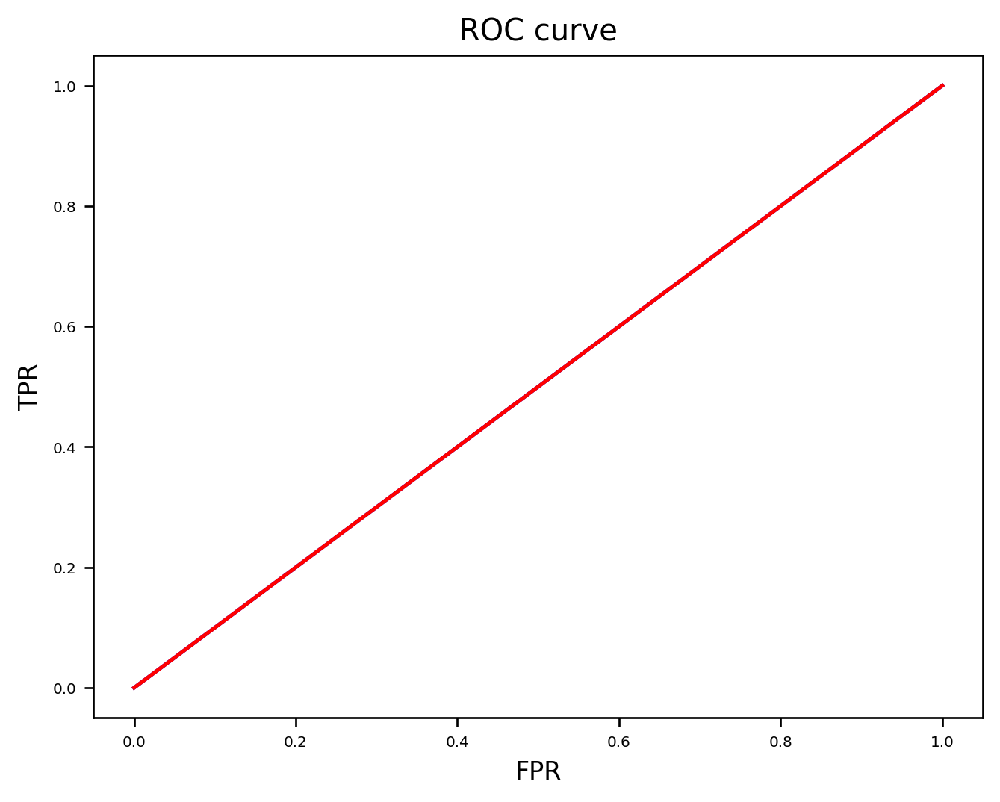

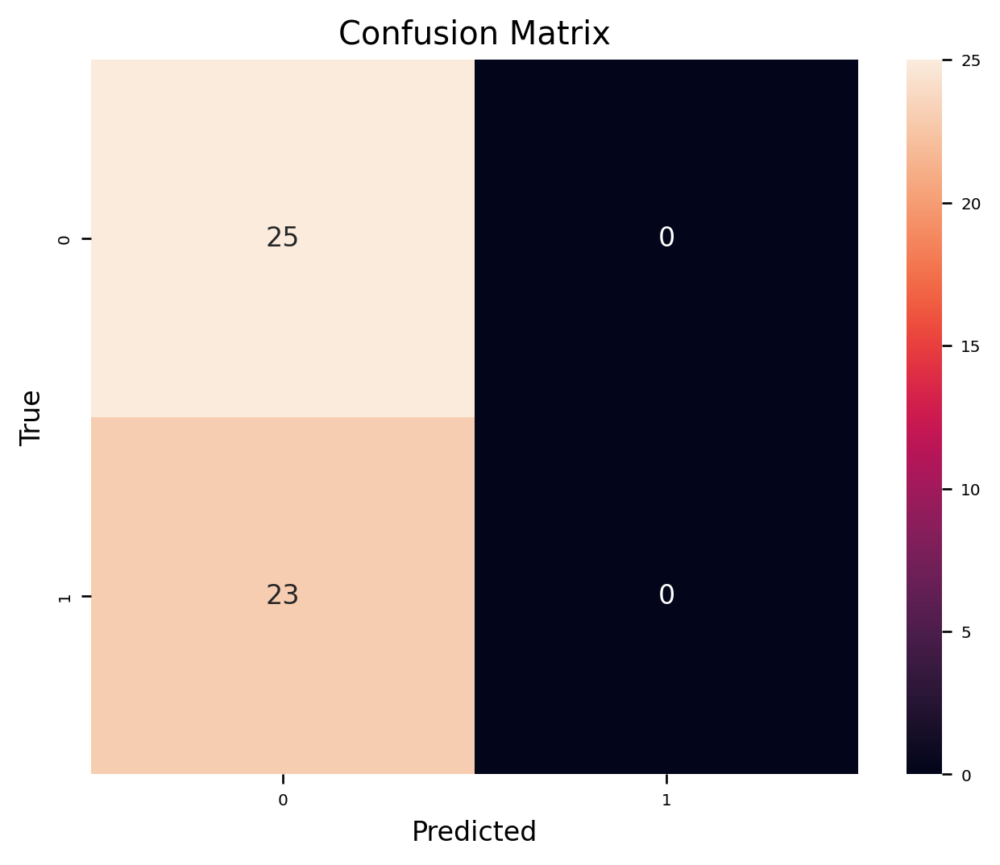

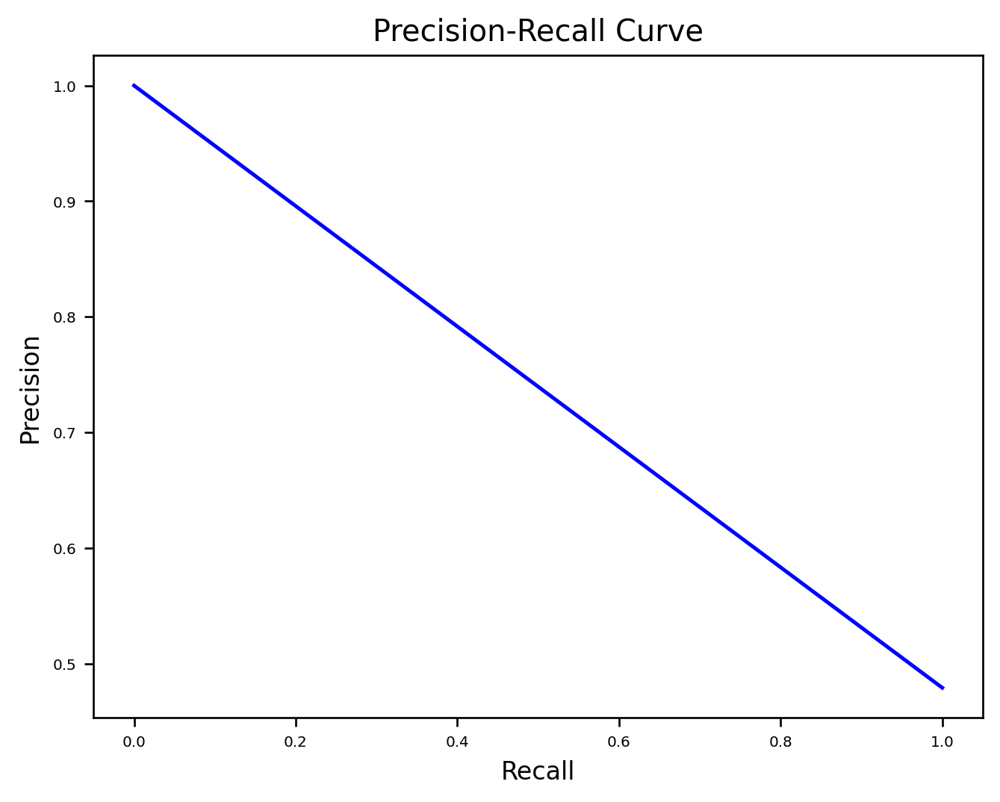

In [18]:
_ = baseline_mandr(y_val, condition_map[0]['y_pred'], condition_map[0]['name'])

-------- start all positive baseline --------

Starting report baseline and metrics for all positive baseline ...
Balanced accuracy: 0.5
Recall: 1.0
Precision: 0.4791666666666667
AUC: 0.5
F1 score: 0.647887323943662
F01 score: 0.48165042504665145
F10 score: 0.9893526405451447

-------- end all positive baseline --------


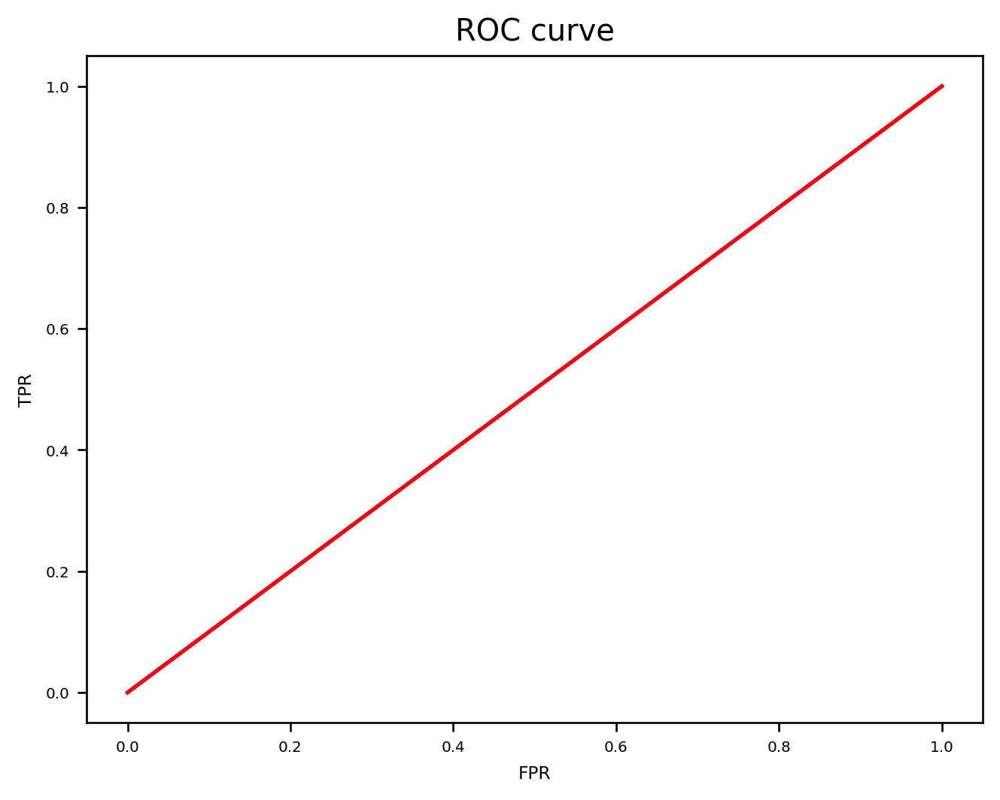

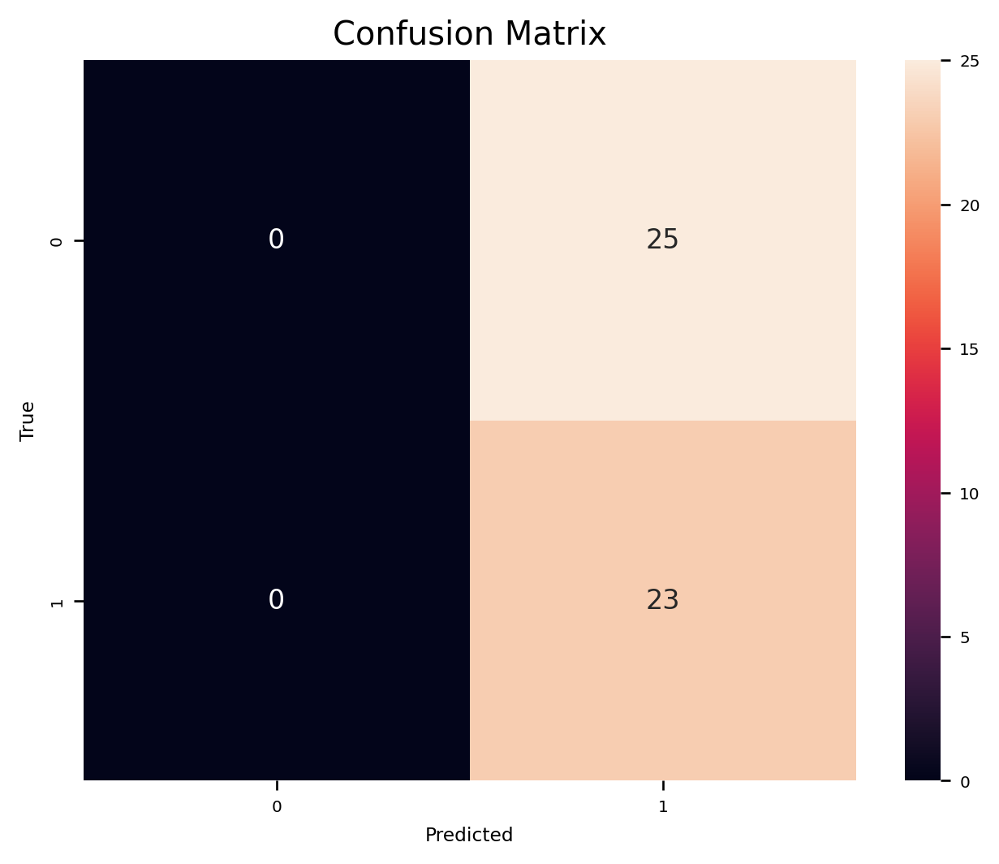

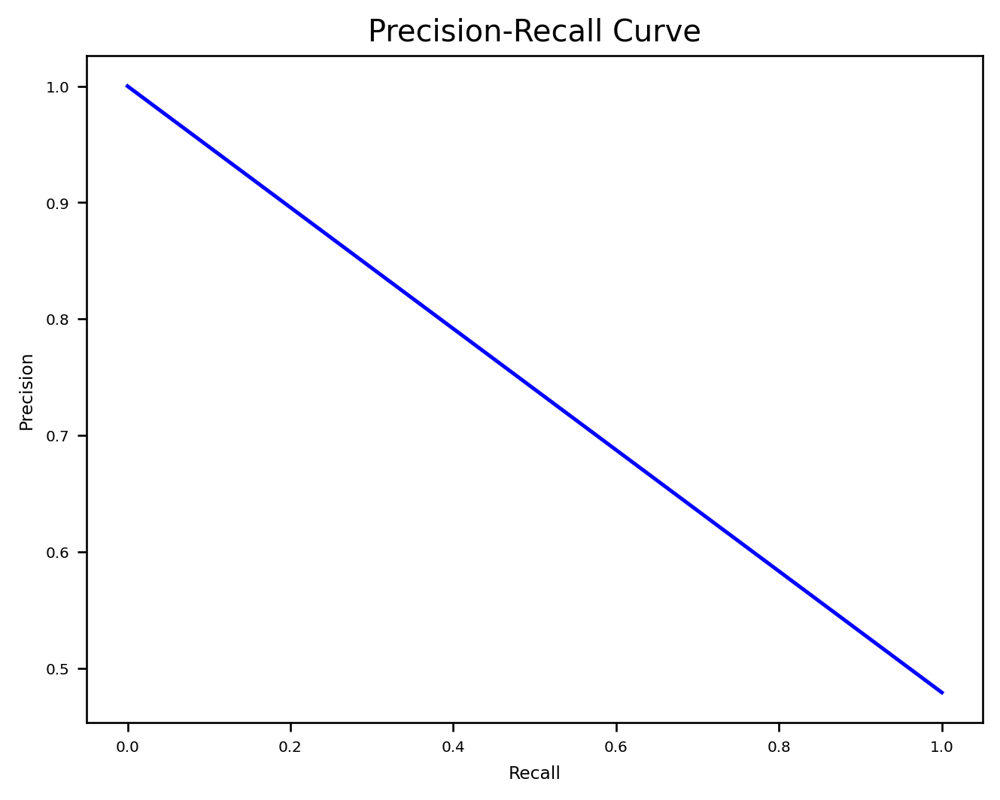

In [17]:
_ = baseline_mandr(y_val,condition_map[1]['y_pred'],condition_map[1]['name'])

-------- start random baseline --------

Starting report baseline and metrics for random baseline ...
Balanced accuracy: 0.5208695652173914
Recall: 0.5217391304347826
Precision: 0.5
AUC: 0.5208695652173914
F1 score: 0.5106382978723404
F01 score: 0.5002063557573256
F10 score: 0.5215146299483648

-------- end random baseline --------


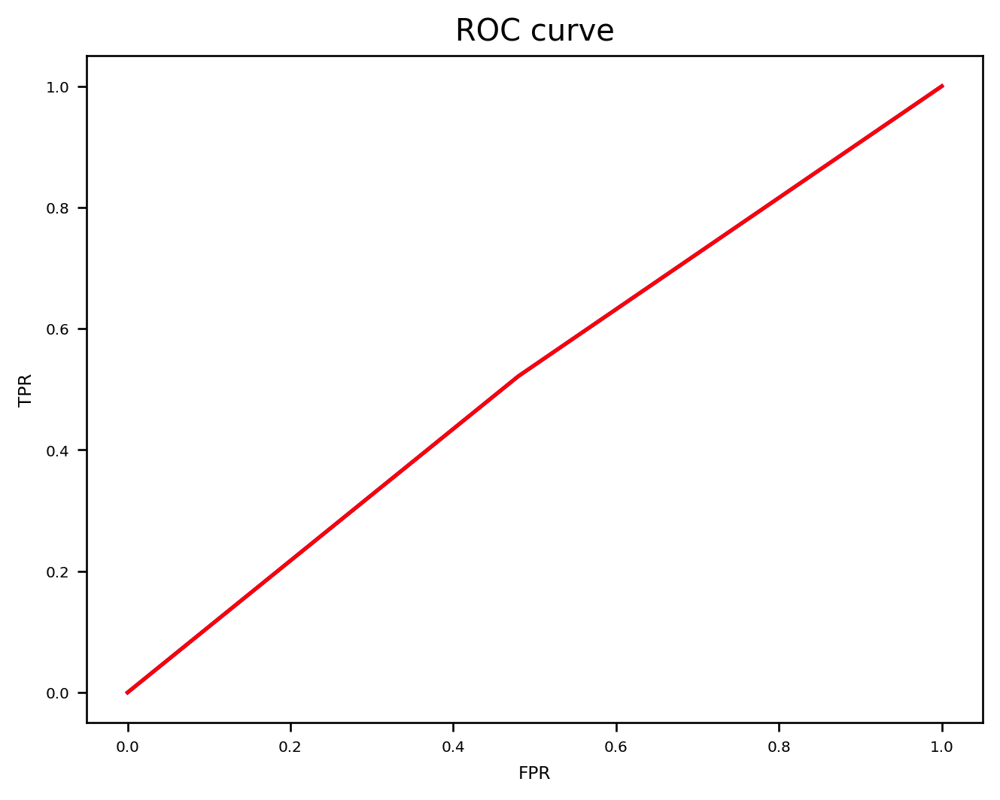

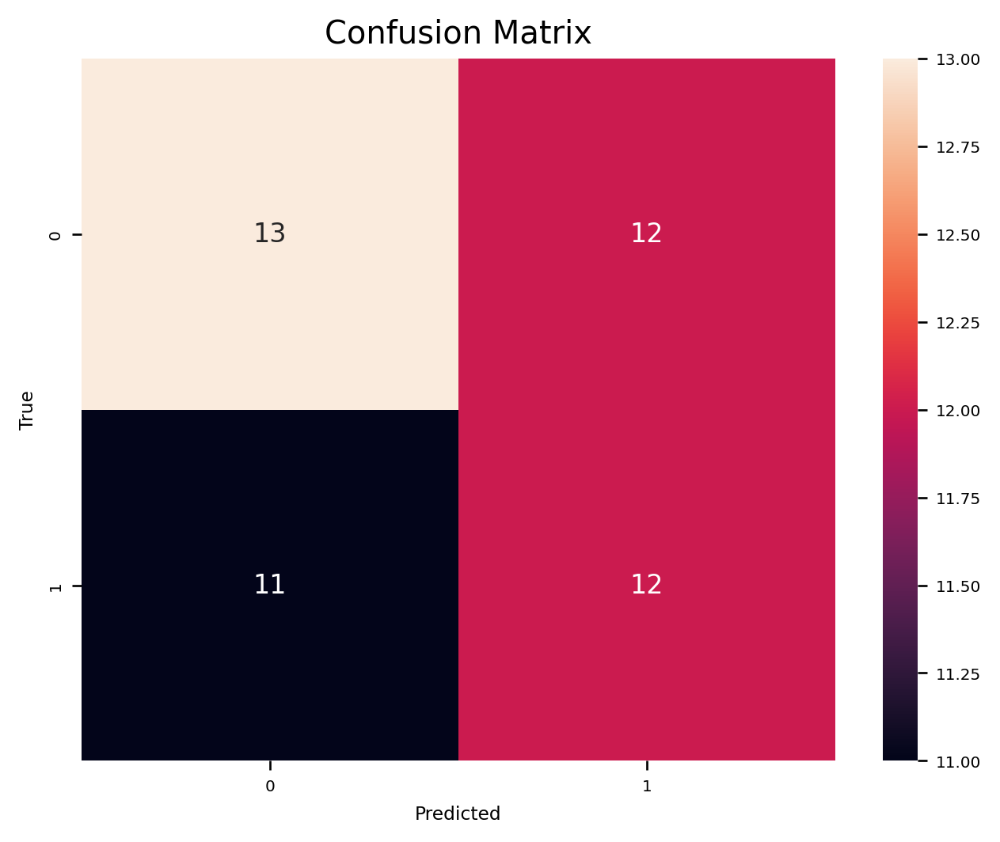

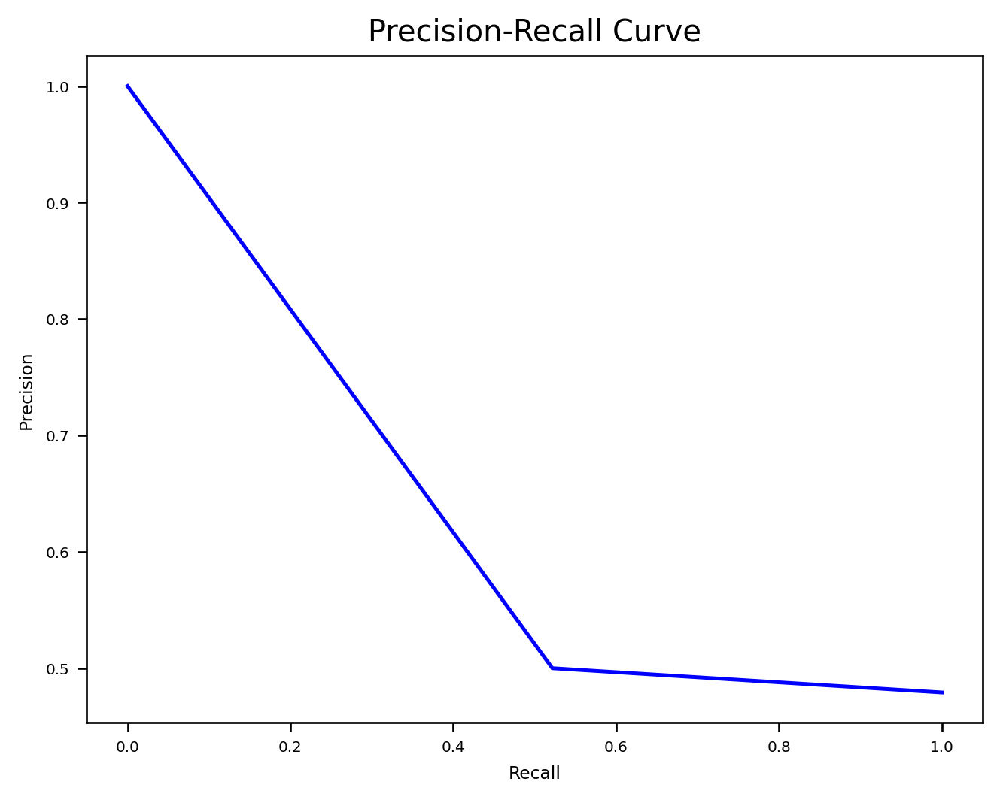

In [18]:
_ = baseline_mandr(y_val,condition_map[2]['y_pred'],condition_map[2]['name'])

### 2.3 Choose a performance metric [0.5 marks]

Based on the above baseline tests and the client's requirements, **choose a performance metric** to use for evaluating/driving your machine learning methods.  **Give a reason for your choice.**

In [21]:
# Your answer here
#I've included the following logic consideration diagram, which may be off based on the prior consideration.
#Additionally, the ROC curve and AUC might represent memory and TPR (the true positive rate is the same as the false positive rate). The performance indicator in the subsequent analysis will be AUC.  

### 2.4 SGD baseline [1 mark]

For a stronger baseline, **train and evaluate** the Stochastic Gradient Descent classifier (as seen in workshop 5). For this baseline case use the default settings for all the hyperparameters.

In [19]:
# Your code here
sgdbase = Pipeline([ ('preproc',pre), ('sgd',SGDClassifier(random_state=42)) ])
sgdbase.fit(x_train,y_train)
y_val_pred = sgdbase.predict(x_val)
sgdbase

Pipeline(steps=[('preproc',
                 Pipeline(steps=[('imputer', SimpleImputer(strategy='median')),
                                 ('std_scaler', StandardScaler())])),
                ('sgd', SGDClassifier(random_state=42))])

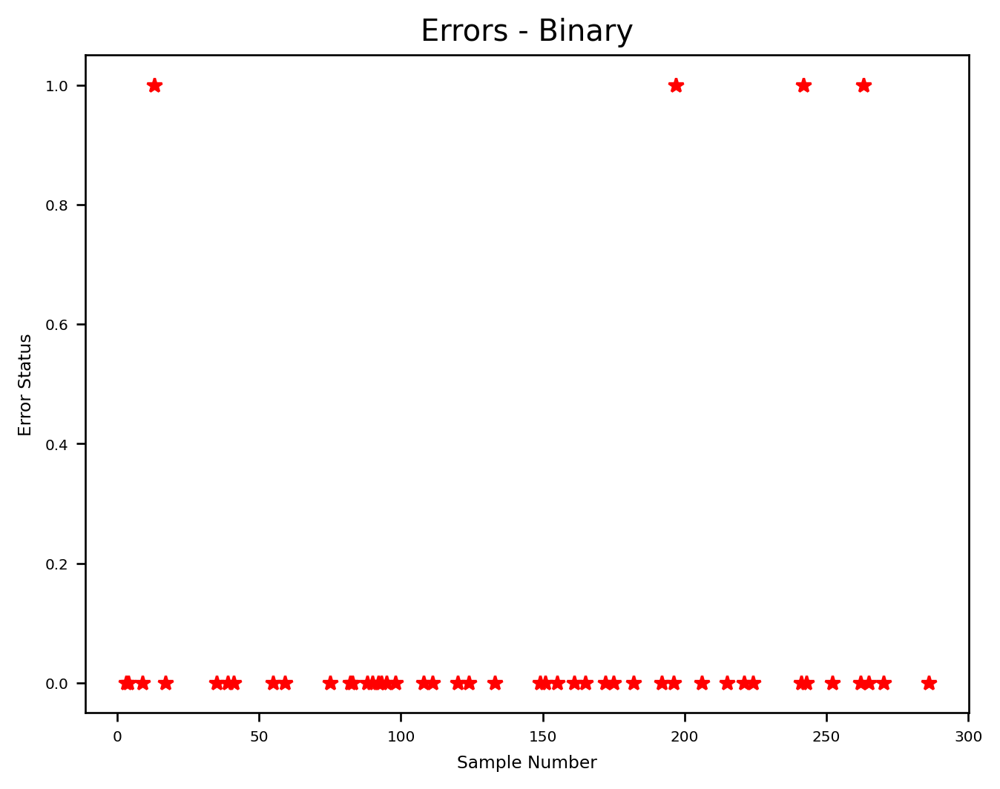

In [20]:
plt.plot(np.abs(y_val - y_val_pred),'r*')
plt.xlabel('Sample Number')
plt.ylabel('Error Status')
plt.title('Errors - Binary')
plt.show()

-------- start SGD baseline --------

Starting report baseline and metrics for SGD baseline ...
Balanced accuracy: 0.9147826086956521
Recall: 0.8695652173913043
Precision: 0.9523809523809523
AUC: 0.9147826086956521
F1 score: 0.909090909090909
F01 score: 0.9514837494112105
F10 score: 0.8703145196036193

-------- end SGD baseline --------


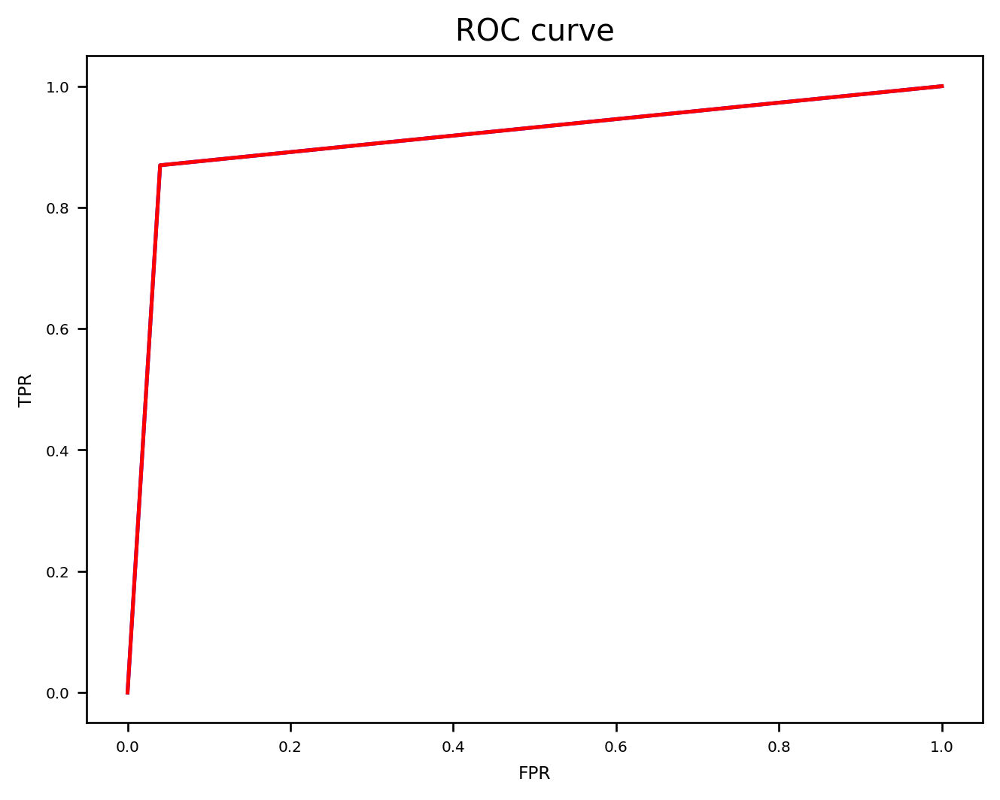

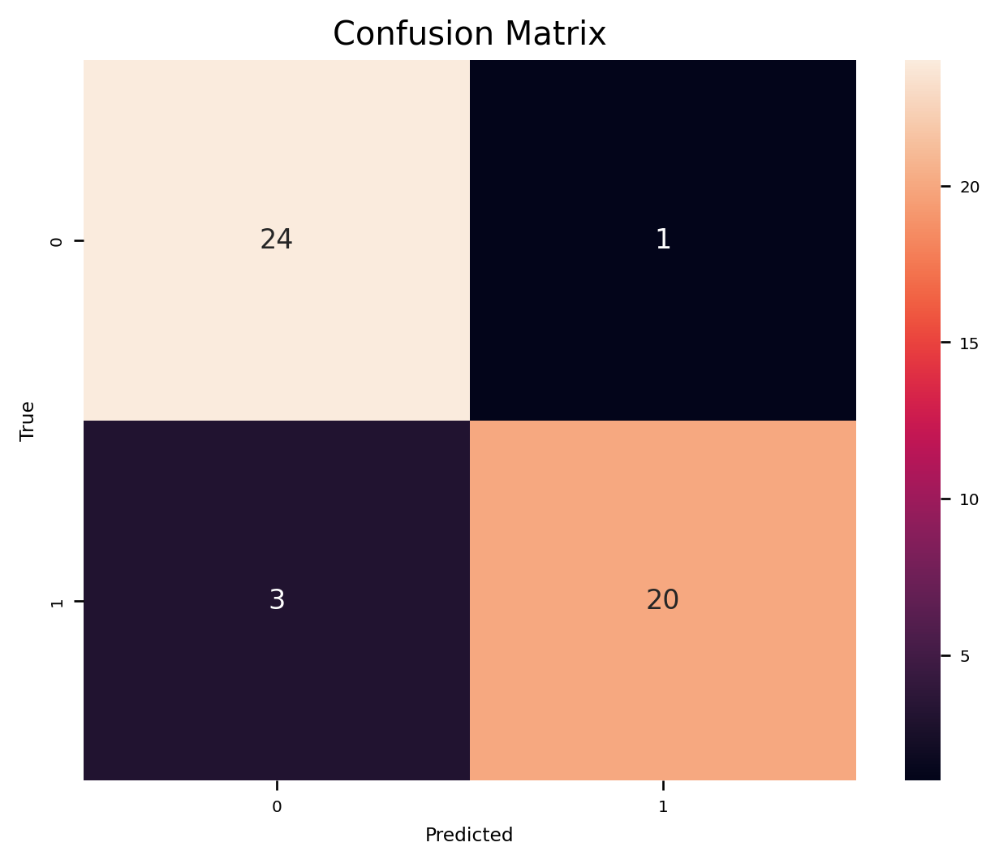

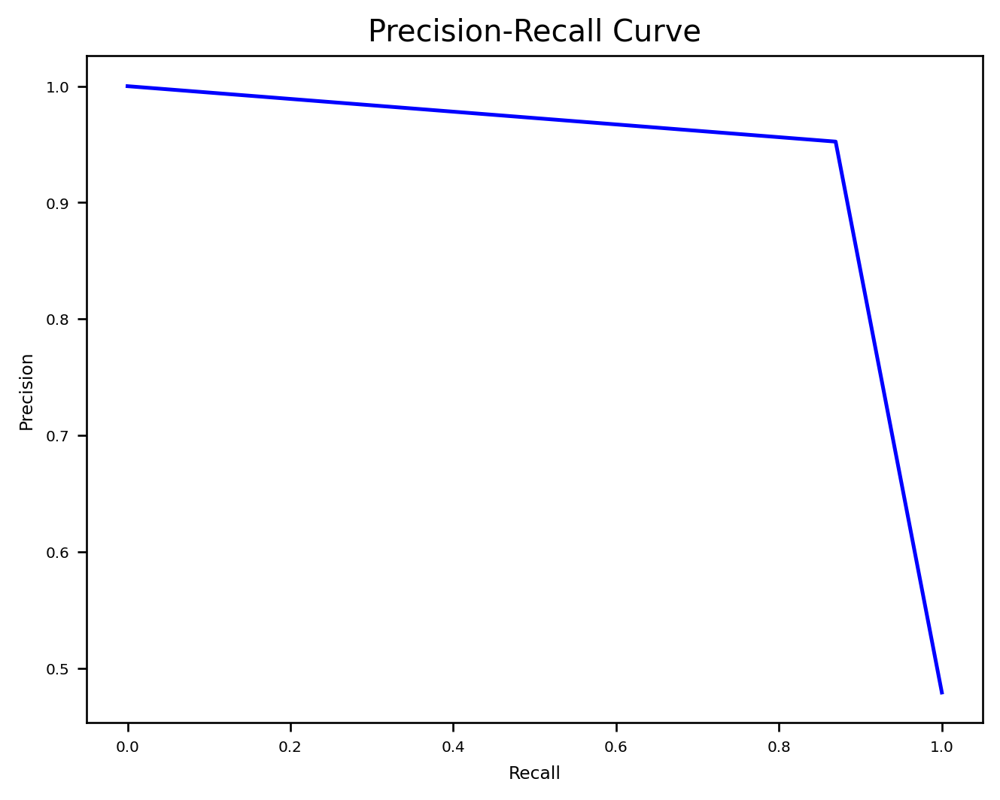

In [21]:
_ = baseline_mandr(y_val,y_val_pred,'SGD baseline')

### 2.5 Confusion matrix [1 mark]

Calculate and display the normalized version of the confusion matrix.  From this **calculate the _probability_ that a sample from a person with a malignant tumour is given a result that they do not have cancer.  Which of the client's two criteria does this relate to, and is this baseline satisfying this criterion or not?**

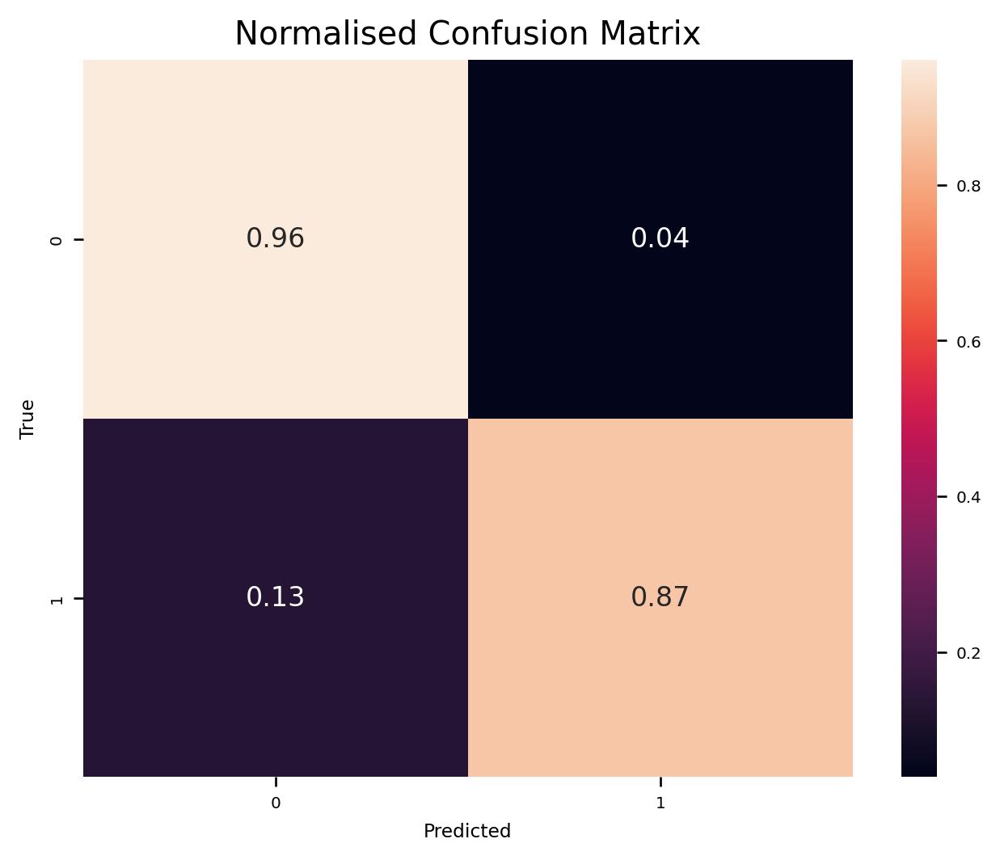

In [22]:
# Your code here
cmat = confusion_matrix(y_true=y_val, y_pred=y_val_pred,normalize='true')
sns.heatmap(cmat, annot=True)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Normalised Confusion Matrix')
plt.show()

In [ ]:
# Your answer here
#There is a 0.13 percent chance that a sample taken from a person who has a positive tumour would show that they are cancer-free.
#The condition of having a 95% likelihood of identifying positive cancer when it develops, which is 0.87, is not met by current baselines. 
#According to the chart above, there is a 4% chance that the results will be incorrect if only one in ten healthy instances (those with benign tumours) are classified as positive.The present baseline serves as the basis for stratifying partial needs. 

### 2.6 Main classifier [11 marks]

**Train and optimise the hyperparameters** to give the best performance for **each of the following classifiers**:
 - KNN (K-Nearest Neighbour) classifier
 - Decision tree classifier
 - Support vector machine classifier
 - SGD classifier
 
Follow best practice as much as possible here. You must make all the choices and decisions yourself, and strike a balance between computation time and performance.

You can use any of the sci-kit learn functions in sklearn.model_selection.cross* and anything used in workshops 3, 4, 5 and 6. Other hyper-parameter optimisation functions apart from these cannot be used (even if they are good and can be part of best practice in other situations - for this assignment everyone should assume they only have very limited computation resources and limit themselves to these functions).

**Display the performance of the different classifiers and the optimised hyperparameters.**

**Based on these results, list the best 3 classifiers and indicate if you think any perform equivalently.**

In [23]:
# Your code here
def pvar(stds):
    n =5
    return np.sqrt(sum((n-1)*(stds**2))/ len(stds)*(n-1))

def plot_grid(cv_results,grid_params,title):

    df = pd.DataFrame(cv_results)
    results = ['mean_test_score',
               'mean_train_score',
               'std_test_score',
               'std_train_score']


    fig, axes = plt.subplots(1, len(grid_params),
                             figsize = (5*len(grid_params), 7),
                             sharey='row')
    axes[0].set_ylabel("Score", fontsize=25)


    for idx, (param_name, param_range) in enumerate(grid_params.items()):
        grouped_df = df.groupby(f'param_{param_name}')[results]\
            .agg({'mean_train_score': 'mean',
                  'mean_test_score': 'mean',
                  'std_train_score': pvar,
                  'std_test_score': pvar})

        previous_group = df.groupby(f'param_{param_name}')[results]
        axes[idx].set_xlabel(param_name, fontsize=30)
        axes[idx].set_ylim(0.0, 1.1)
        lw = 2
        axes[idx].plot(param_range, grouped_df['mean_train_score'], label="Training score",
                    color="darkorange", lw=lw)
        axes[idx].fill_between(param_range,grouped_df['mean_train_score'] - grouped_df['std_train_score'],
                        grouped_df['mean_train_score'] + grouped_df['std_train_score'], alpha=0.2,
                        color="darkorange", lw=lw)
        axes[idx].plot(param_range, grouped_df['mean_test_score'], label="Cross-validation score",
                    color="navy", lw=lw)
        axes[idx].fill_between(param_range, grouped_df['mean_test_score'] - grouped_df['std_test_score'],
                        grouped_df['mean_test_score'] + grouped_df['std_test_score'], alpha=0.2,
                        color="navy", lw=lw)

    handles, labels = axes[0].get_legend_handles_labels()
    fig.suptitle(f'{title} Validation curves', fontsize=30)
    fig.legend(handles, labels, loc=8, ncol=2, fontsize=20)

    fig.subplots_adjust(bottom=0.25, top=0.85)
    plt.show()

In [24]:
# Your answer here
knn_pl = Pipeline([ ('preproc',pre), ('knn',KNeighborsClassifier(n_neighbors=3))])

knn_params = dict(
    knn__n_neighbors=range(1,20),
    knn__weights=['uniform','distance'],
    knn__metric=['euclidean','manhattan','minkowski'],
    knn__algorithm=['auto','ball_tree','kd_tree','brute'],
    knn__p=range(1,20)
)


dt_pl = Pipeline([ ('preproc',pre), ('dt',DecisionTreeClassifier(random_state=42))])

dt_params = dict(
    dt__criterion=['gini','entropy'],
    dt__max_depth=range(1,20),
    dt__min_samples_split=range(2,20),
    dt__min_samples_leaf=range(1,20),
    dt__max_features=['auto','sqrt','log2'],
)

svc_pl = Pipeline([ ('preproc',pre), ('svc',SVC(random_state=42))])

svc_params = dict(
    svc__C=[0.001, 0.01, 0.1, 1, 10, 100, 1000, 6750],
    svc__kernel=['linear','rbf','poly','sigmoid'],
    svc__gamma=['scale', 'auto'],
)

sgd_pl = Pipeline([ ('preproc',pre), ('sgd',SGDClassifier(random_state=42)) ])

sgd_params = dict(
    sgd__loss=['hinge','log','modified_huber','perceptron'],
    sgd__penalty=['l2','l1','elasticnet'],
    sgd__alpha=[0.0001, 0.001, 0.01, 0.1, 1, 10, 100, 1000],
    sgd__learning_rate=['constant','optimal','invscaling','adaptive'],
    sgd__eta0=[0.0001, 0.001, 0.01, 0.1, 1, 10, 100, 1000]
)

scorer = 'roc_auc'
part2_main_classifier_score_list = list()

best_params_ : {'knn__algorithm': 'auto', 'knn__metric': 'euclidean', 'knn__n_neighbors': 19, 'knn__p': 1, 'knn__weights': 'distance'}
-------- start KNN classifier --------

Starting report baseline and metrics for KNN classifier ...
Balanced accuracy: 0.9365217391304348
Recall: 0.9130434782608695
Precision: 0.9545454545454546
AUC: 0.9365217391304348
F1 score: 0.9333333333333332
F01 score: 0.9541160593792173
F10 score: 0.9134366925064599

-------- end KNN classifier --------


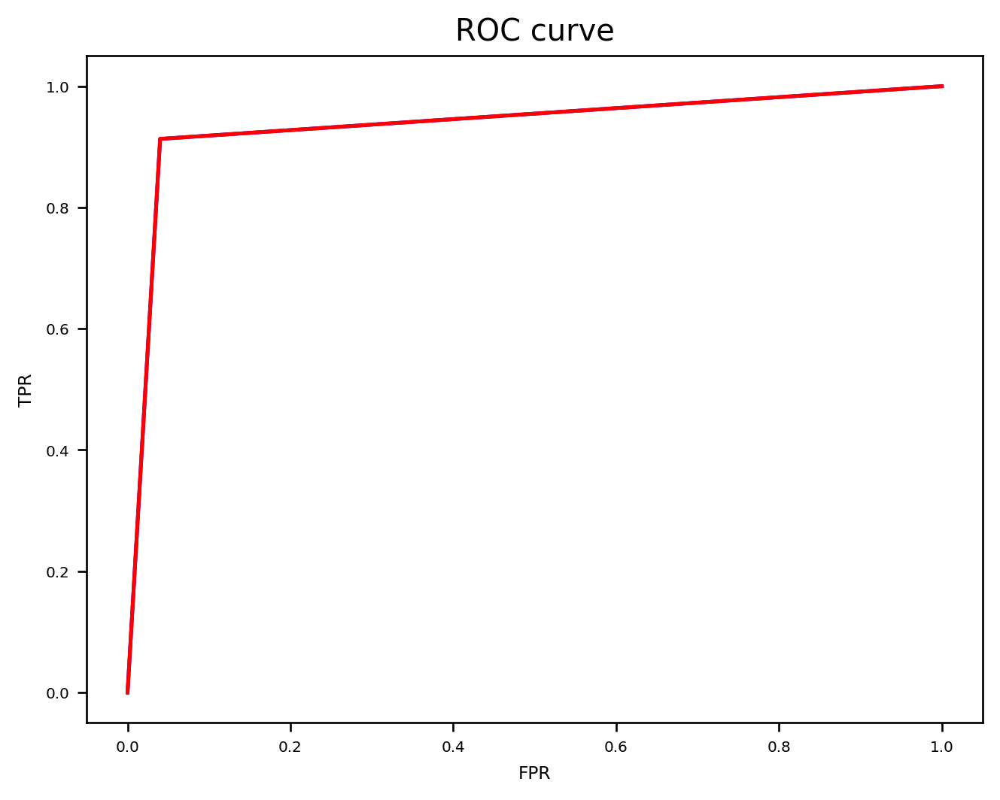

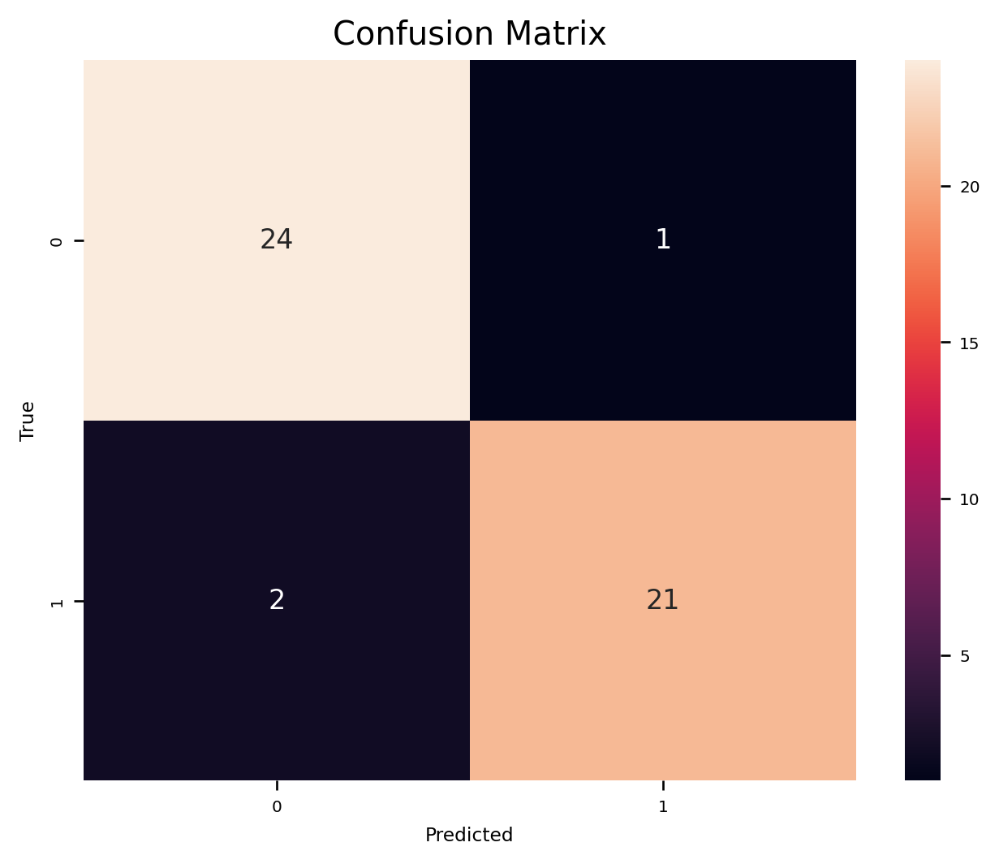

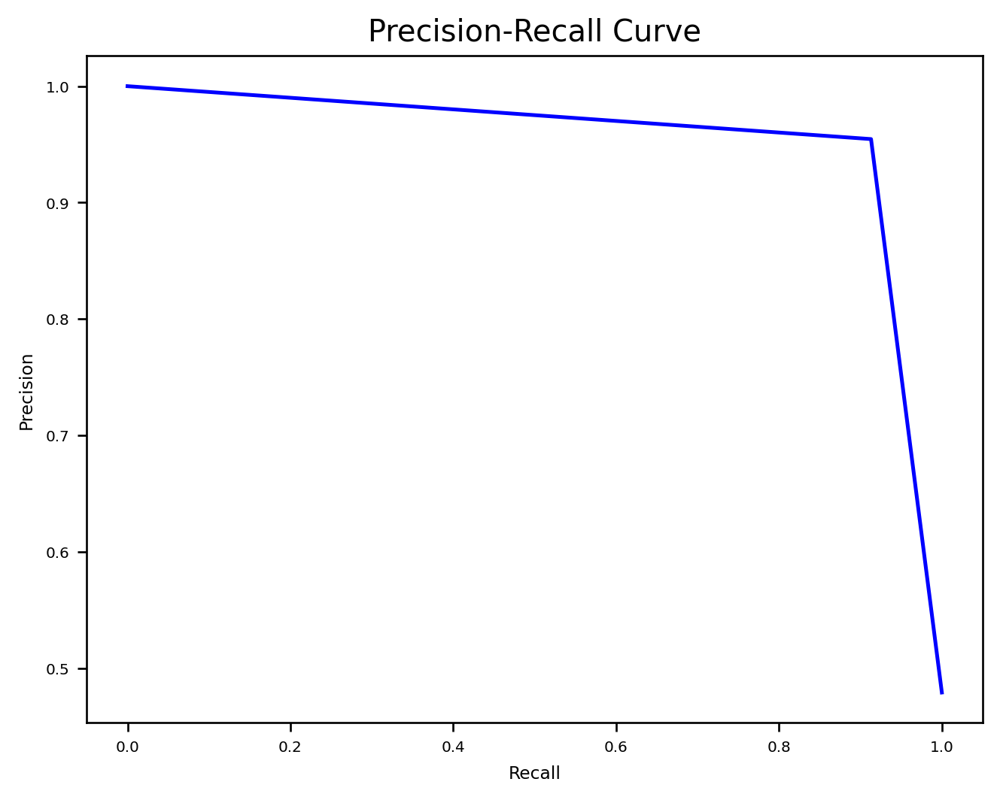

In [27]:
# knn_pl.fit(X_train,y_train)
knn_cv = GridSearchCV(knn_pl,knn_params,cv=5,n_jobs=-1,scoring=scorer,return_train_score=True).fit(x_train,y_train)

print(f'best_params_ : {knn_cv.best_params_}')

knn_cv.best_estimator_.fit(x_train,y_train)
y_val_pred = knn_cv.best_estimator_.predict(x_val)
part2_main_classifier_score_list.append(baseline_mandr(y_val,y_val_pred,'KNN classifier'))

best_params_ : {'dt__criterion': 'gini', 'dt__max_depth': 4, 'dt__max_features': 'log2', 'dt__min_samples_leaf': 5, 'dt__min_samples_split': 2}
-------- start Decision tree classifier --------

Starting report baseline and metrics for Decision tree classifier ...
Balanced accuracy: 0.8713043478260869
Recall: 0.782608695652174
Precision: 0.9473684210526315
AUC: 0.8713043478260869
F1 score: 0.8571428571428571
F01 score: 0.9453978159126364
F10 score: 0.7839586028460545

-------- end Decision tree classifier --------


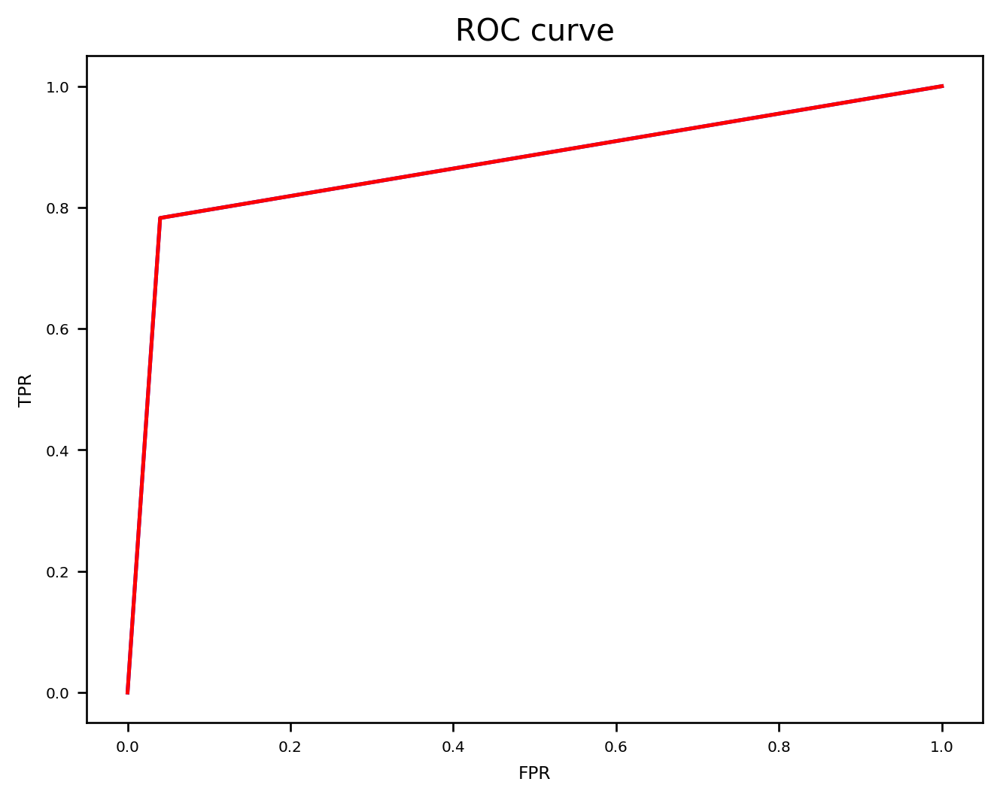

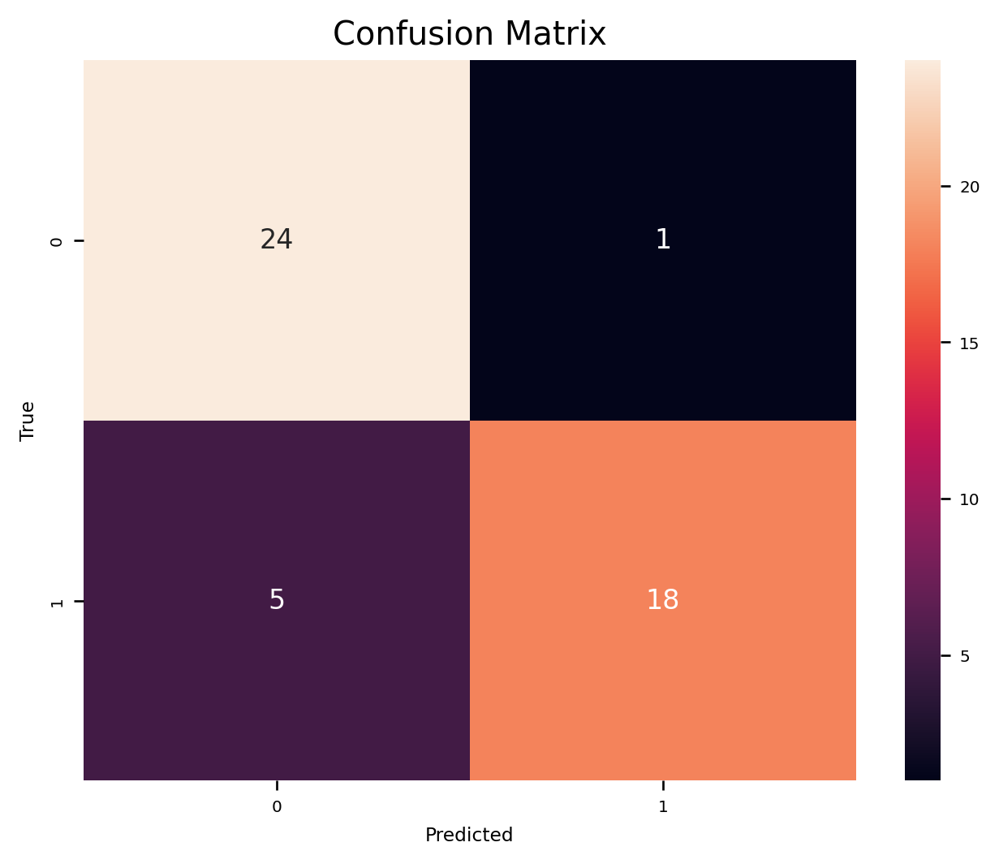

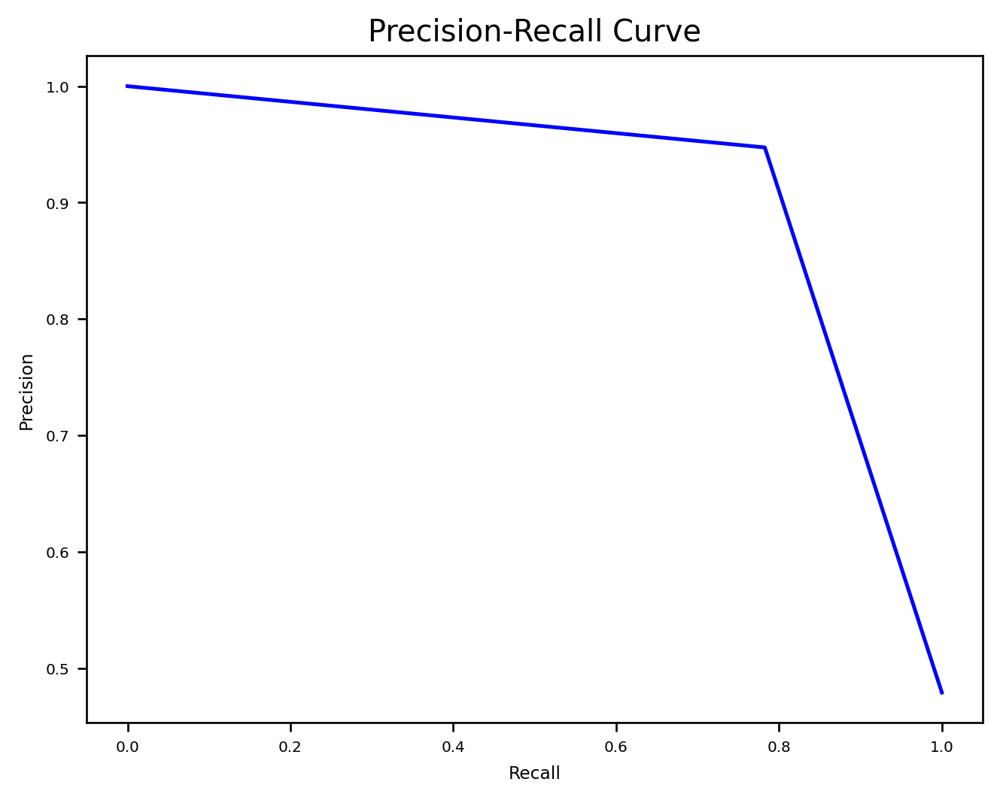

In [28]:
dt_cv = GridSearchCV(dt_pl,dt_params,cv=5,n_jobs=-1,scoring=scorer,return_train_score=True).fit(x_train,y_train)

print(f'best_params_ : {dt_cv.best_params_}')

dt_cv.best_estimator_.fit(x_train,y_train)
y_val_pred = dt_cv.best_estimator_.predict(x_val)
part2_main_classifier_score_list.append(baseline_mandr(y_val,y_val_pred,'Decision tree classifier'))

best_params_ : {'svc__C': 1, 'svc__gamma': 'scale', 'svc__kernel': 'rbf'}
-------- start Support vector machine classifier --------

Starting report baseline and metrics for Support vector machine classifier ...
Balanced accuracy: 0.9365217391304348
Recall: 0.9130434782608695
Precision: 0.9545454545454546
AUC: 0.9365217391304348
F1 score: 0.9333333333333332
F01 score: 0.9541160593792173
F10 score: 0.9134366925064599

-------- end Support vector machine classifier --------


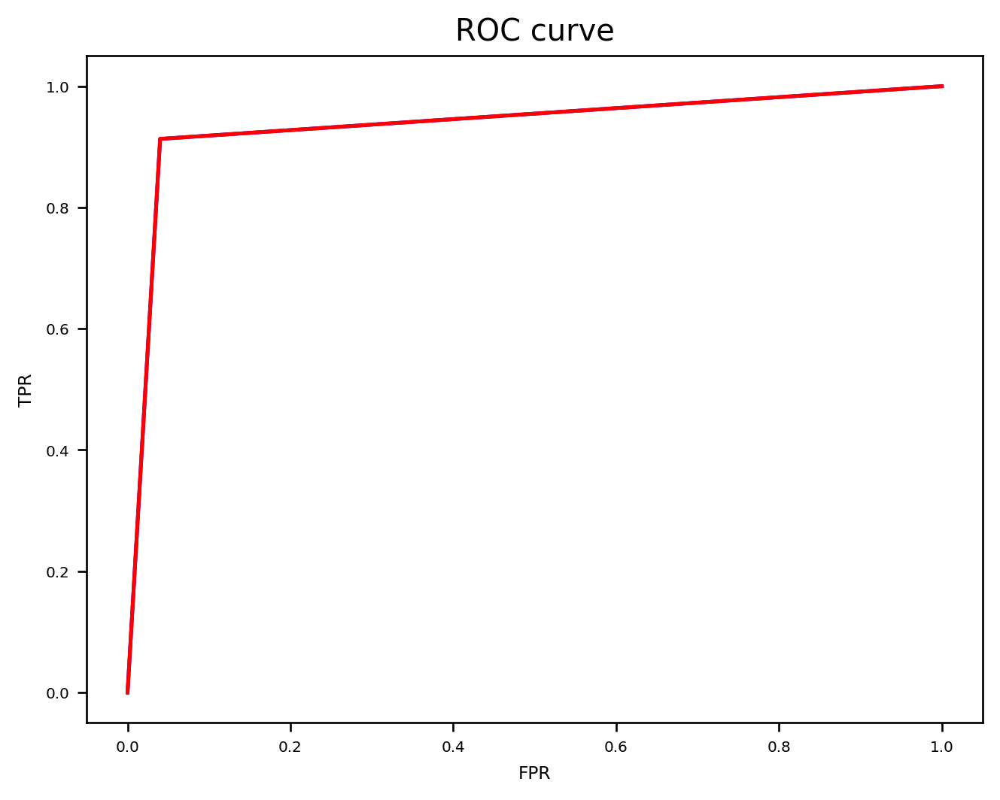

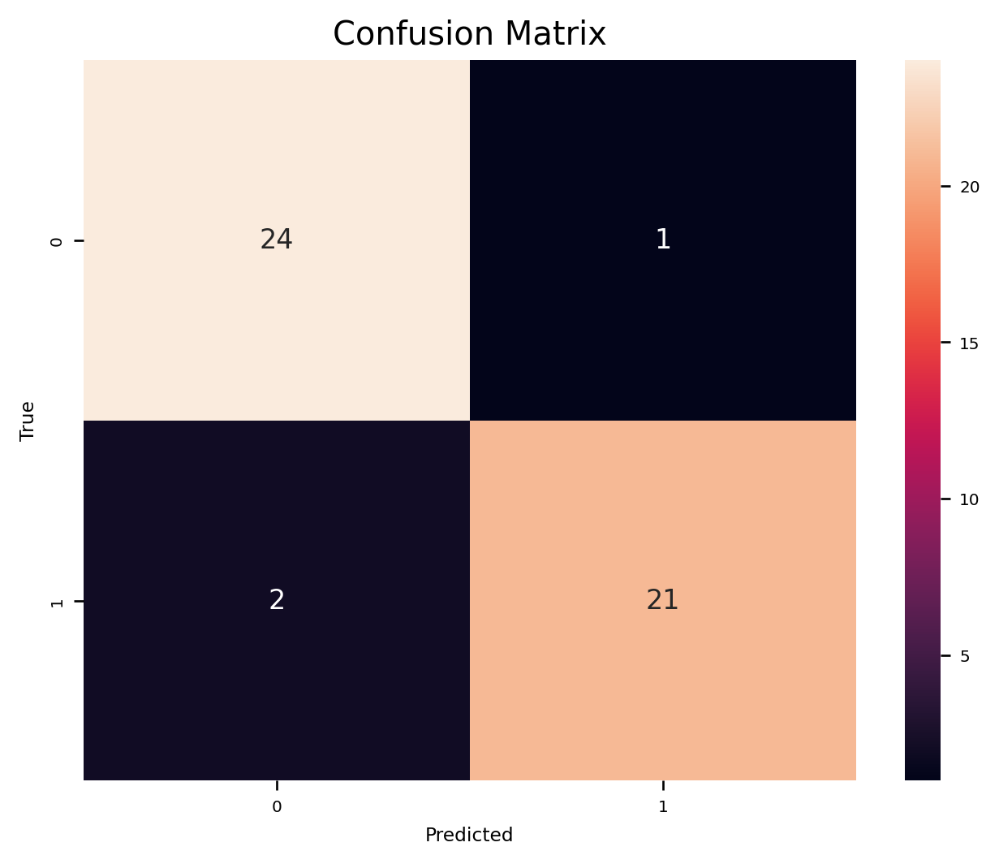

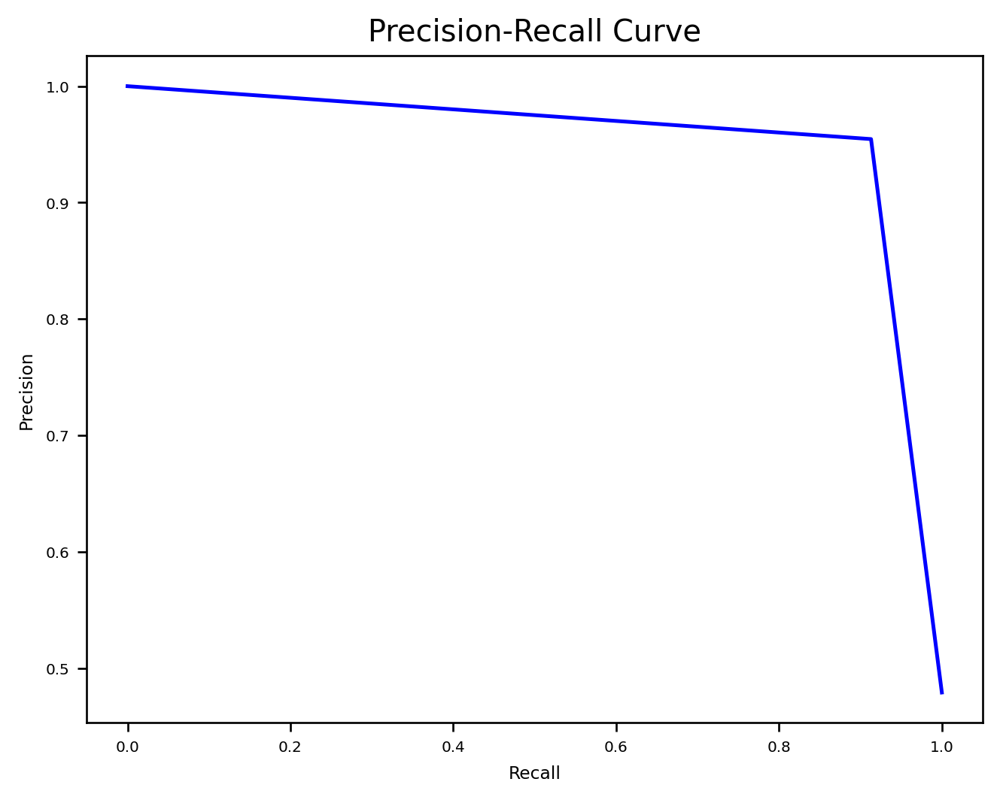

In [29]:
svc_cv = GridSearchCV(svc_pl,svc_params,cv=5,n_jobs=-1,error_score='raise',scoring=scorer,return_train_score=True).fit(x_train,y_train)

print(f'best_params_ : {svc_cv.best_params_}')

svc_cv.best_estimator_.fit(x_train,y_train)
y_val_pred = svc_cv.best_estimator_.predict(x_val)
part2_main_classifier_score_list.append(baseline_mandr(y_val,y_val_pred,'Support vector machine classifier'))

best_params_ : {'sgd__alpha': 1000, 'sgd__eta0': 100, 'sgd__learning_rate': 'adaptive', 'sgd__loss': 'perceptron', 'sgd__penalty': 'l2'}
-------- start SGD classifier --------

Starting report baseline and metrics for SGD classifier ...
Balanced accuracy: 0.9582608695652174
Recall: 0.9565217391304348
Precision: 0.9565217391304348
AUC: 0.9582608695652174
F1 score: 0.9565217391304348
F01 score: 0.9565217391304348
F10 score: 0.9565217391304349

-------- end SGD classifier --------


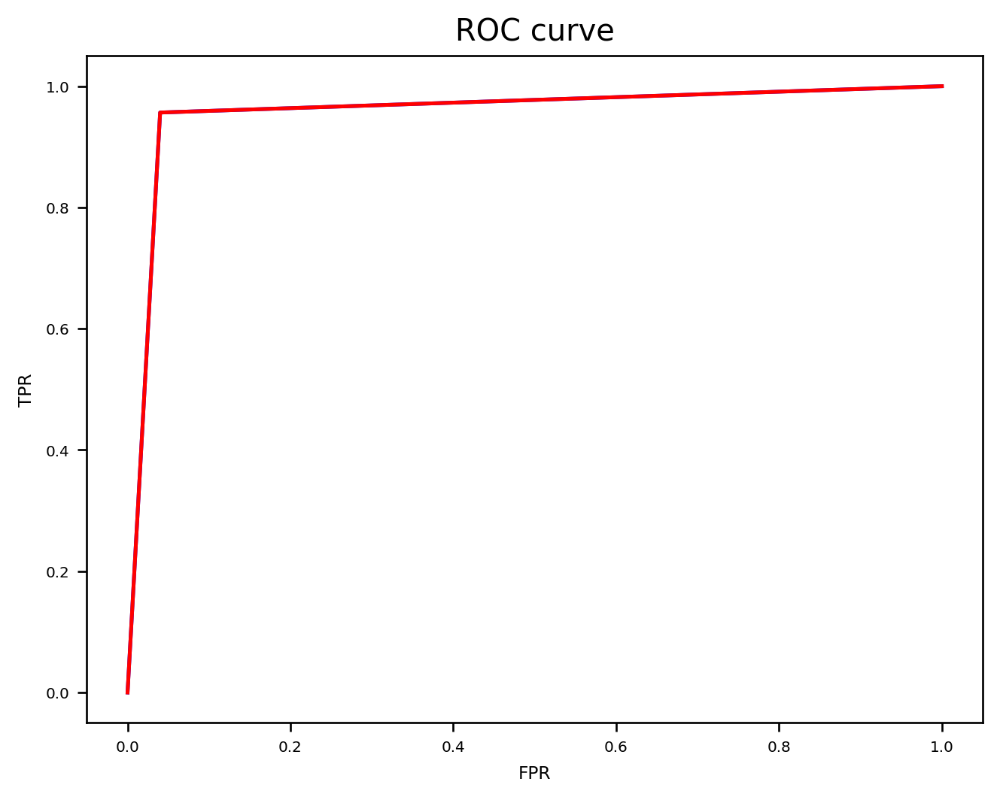

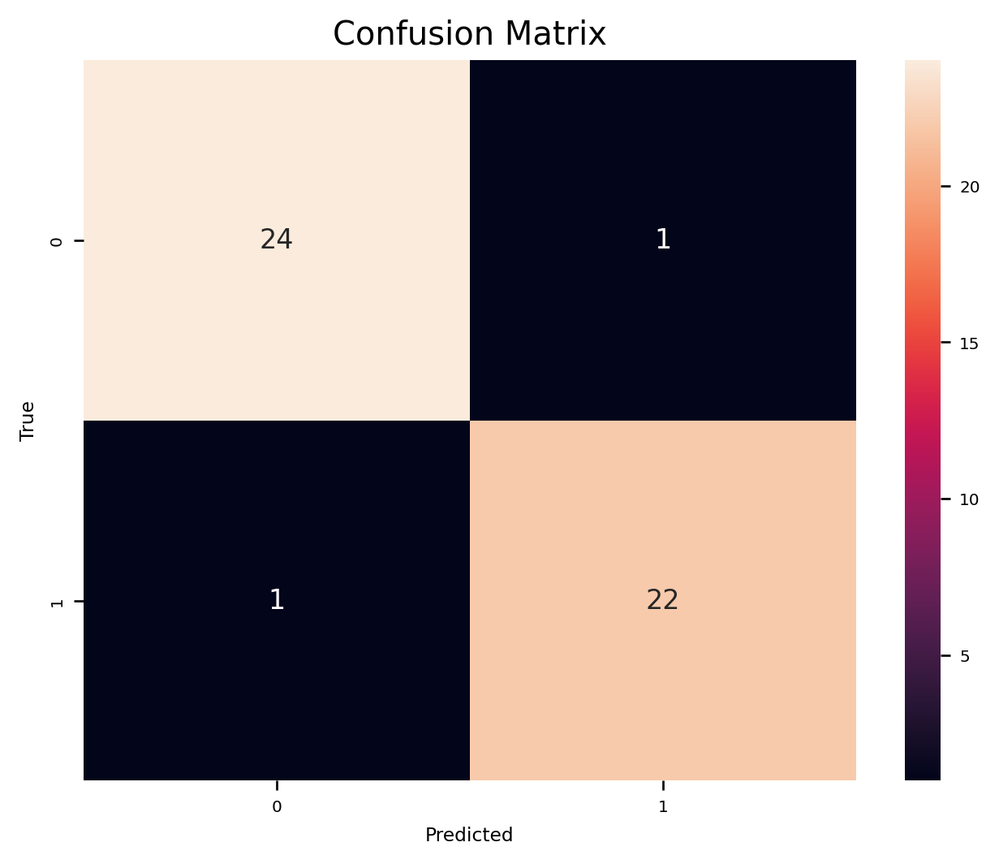

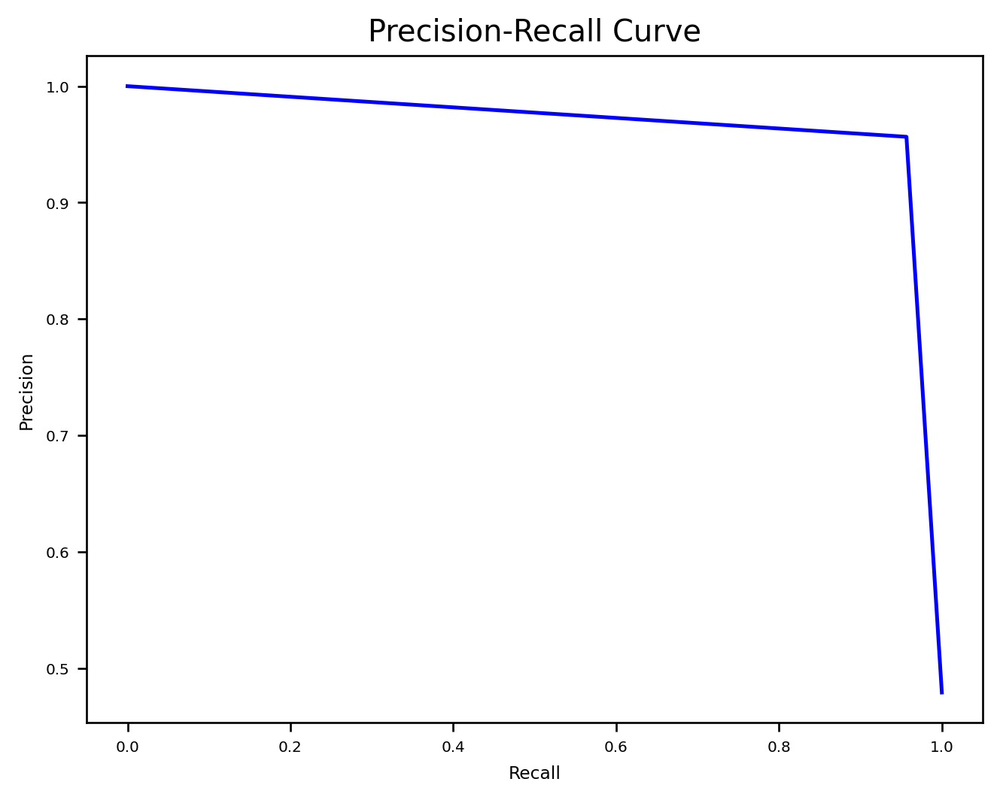

In [30]:
sgd_cv = GridSearchCV(sgd_pl,sgd_params,cv=5,n_jobs=-1,scoring=scorer,error_score='raise',return_train_score=True).fit(x_train,y_train)

print(f'best_params_ : {sgd_cv.best_params_}')

y_val_pred = sgd_cv.best_estimator_.predict(x_val)
part2_main_classifier_score_list.append(baseline_mandr(y_val,y_val_pred,'SGD classifier'))

In [32]:
def plot_compare_classifier_score(classifier_score_list):
    data = [[score["name"]] for score in classifier_score_list]
    for index,d in enumerate(data):
        d.append(classifier_score_list[index]["auc"])
        d.append(classifier_score_list[index]["accuracy"])
        d.append(classifier_score_list[index]["precision"])
        d.append(classifier_score_list[index]["recall"])

    df = pd.DataFrame(data,columns=["Classifier","AUC-score","Accuracy","Precision","Recall"])

    df.plot(kind='bar',x='Classifier',y=['AUC-score','Accuracy','Precision','Recall'],title='Classifier comparison',figsize=(10,5))
    plt.show()
    pprint(df.head())

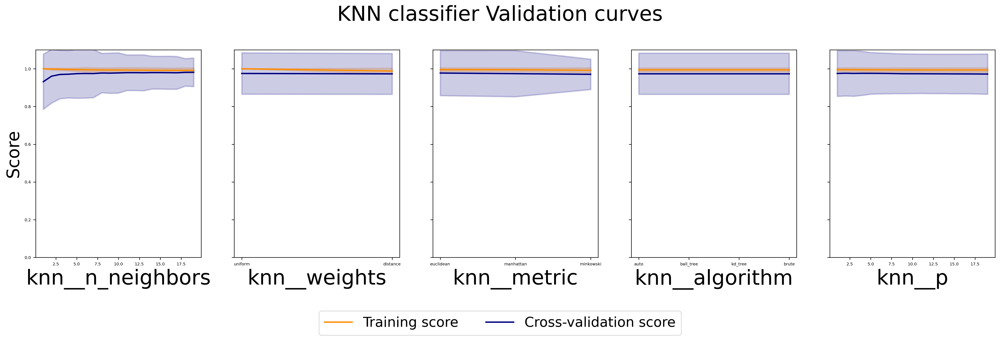

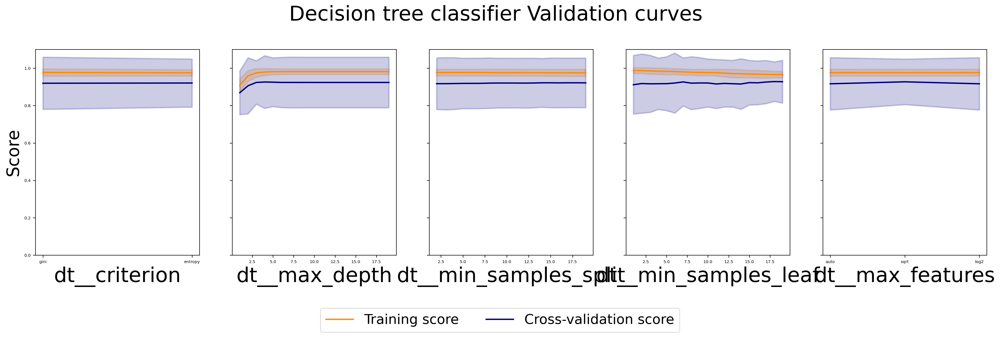

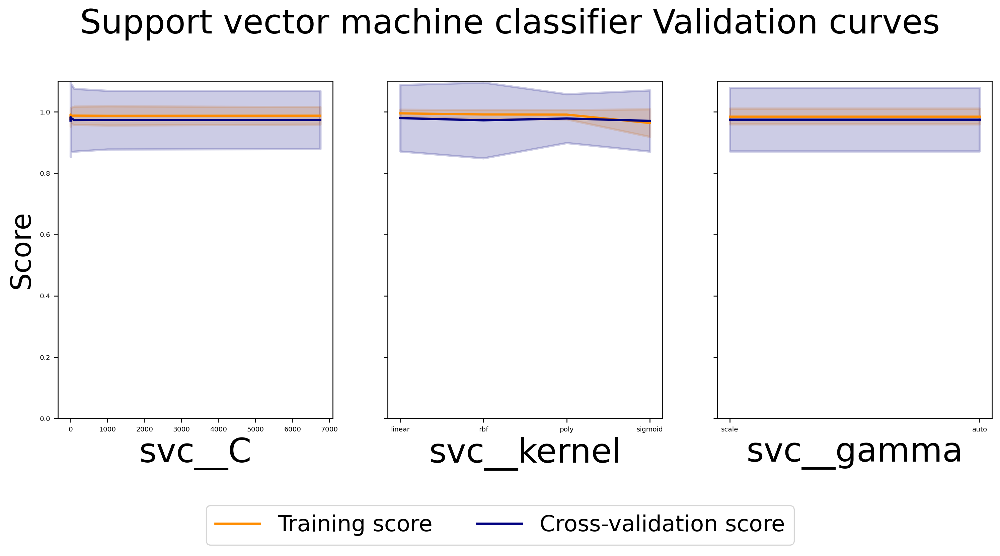

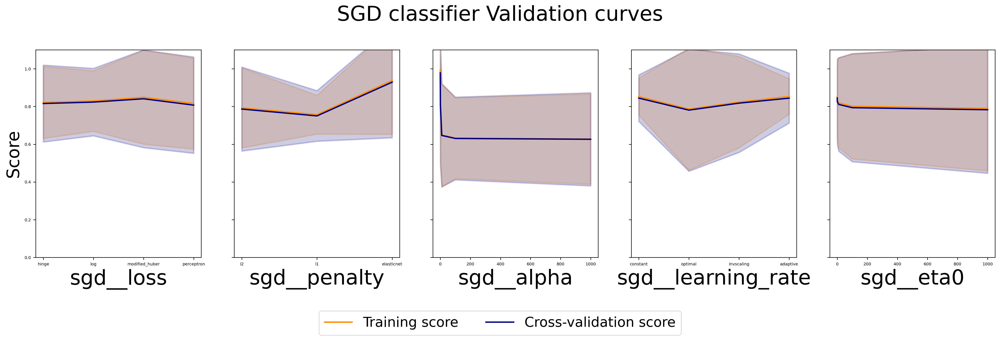

In [33]:
plot_grid(knn_cv.cv_results_,knn_params,"KNN classifier")
plot_grid(dt_cv.cv_results_,dt_params,"Decision tree classifier")
plot_grid(svc_cv.cv_results_,svc_params,"Support vector machine classifier")
plot_grid(sgd_cv.cv_results_,sgd_params,"SGD classifier")

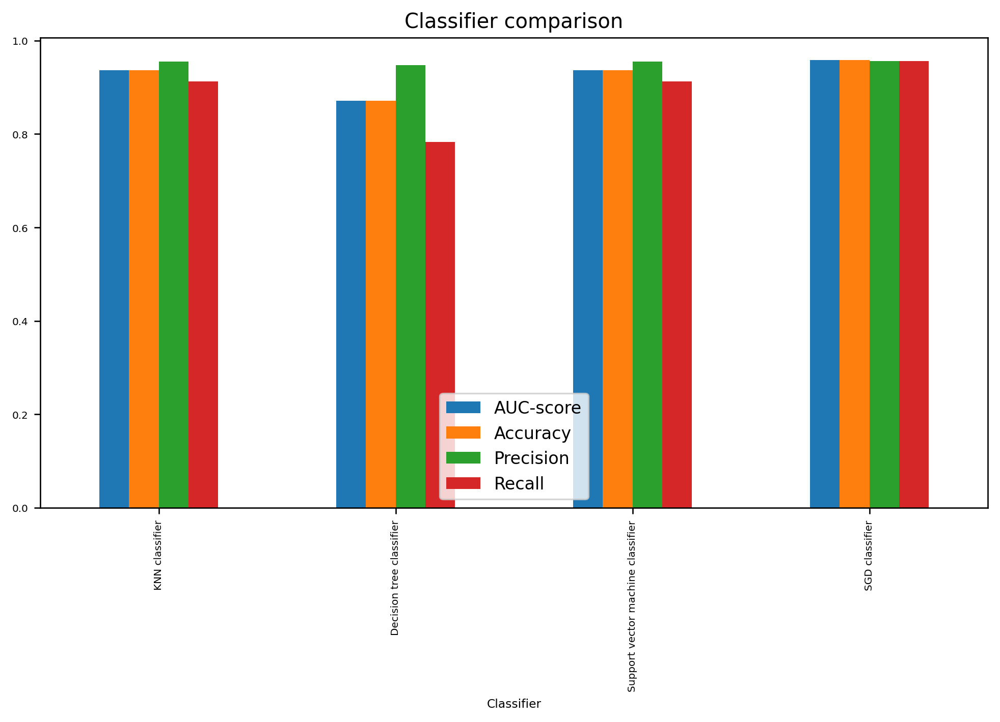

                          Classifier  AUC-score  Accuracy  Precision    Recall
0                     KNN classifier   0.936522  0.936522   0.954545  0.913043
1           Decision tree classifier   0.871304  0.871304   0.947368  0.782609
2  Support vector machine classifier   0.936522  0.936522   0.954545  0.913043
3                     SGD classifier   0.958261  0.958261   0.956522  0.956522


In [44]:
plot_compare_classifier_score(part2_main_classifier_score_list)

### 2.7 Model selection [1 mark]

**Choose the best classifier** (as seen in workshops 3 to 6) and give details of your hyperparameter settings. **Explain the reason for your choice.**

In [45]:
# Your answer here
print(f'best_params_ : {sgd_cv.best_params_}')
model = sgd_cv.best_estimator_

best_params_ : {'sgd__alpha': 1000, 'sgd__eta0': 100, 'sgd__learning_rate': 'adaptive', 'sgd__loss': 'perceptron', 'sgd__penalty': 'l2'}


### 2.8 Final performance [1.5 marks]

**Calculate and display an unbiased performance measure that you can present to the client.**

**Is your chosen classifier underfitting or overfitting?**

**Does your chosen classifier meet the client's performance criteria?**

-------- start SGD classifier --------

Starting report baseline and metrics for SGD classifier ...
Balanced accuracy: 0.967741935483871
Recall: 1.0
Precision: 0.9354838709677419
AUC: 0.967741935483871
F1 score: 0.9666666666666666
F01 score: 0.9360818152764462
F10 score: 0.9993176390310474

-------- end SGD classifier --------


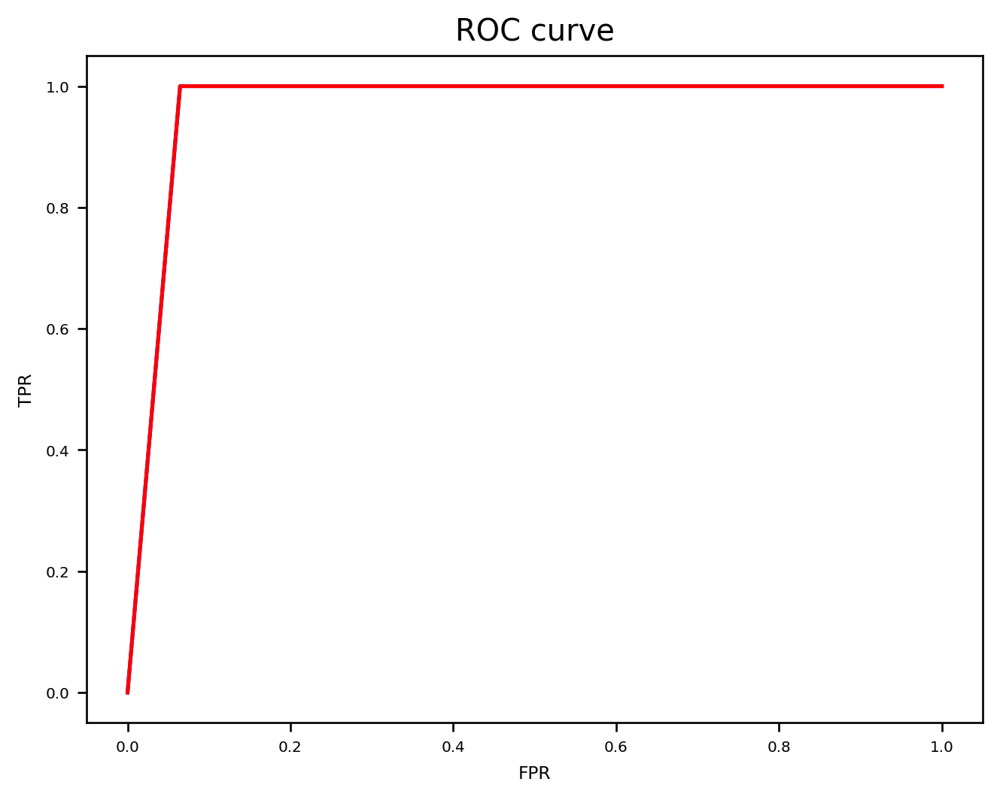

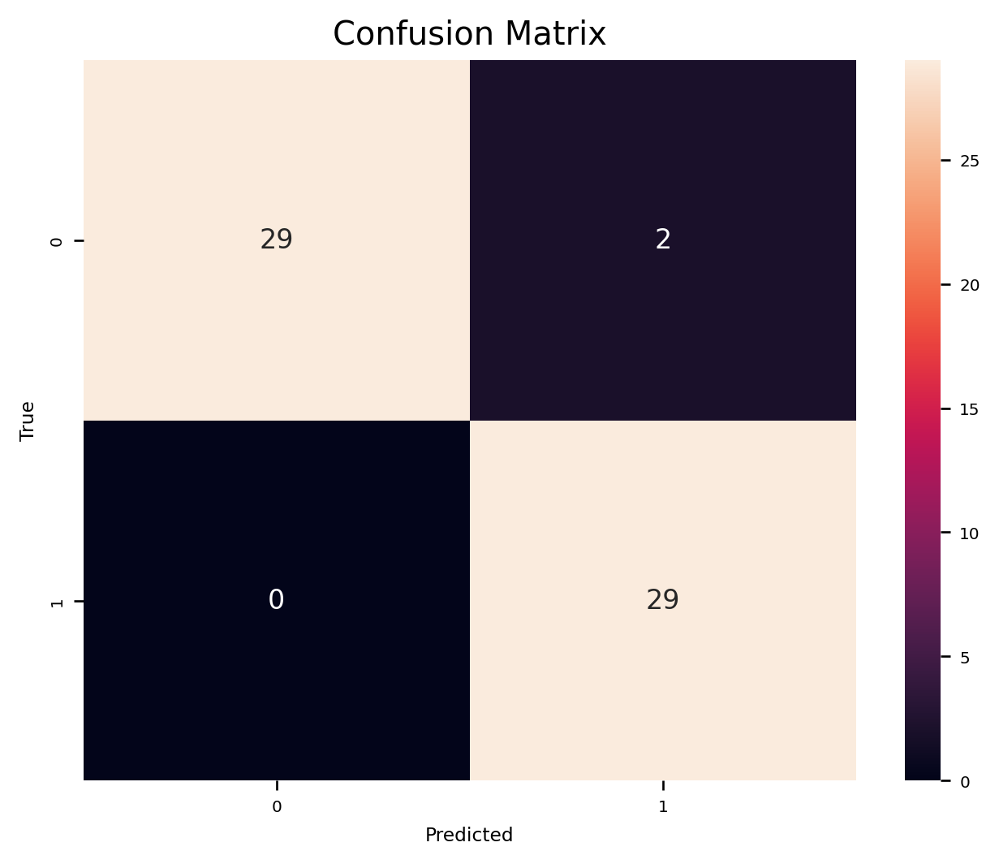

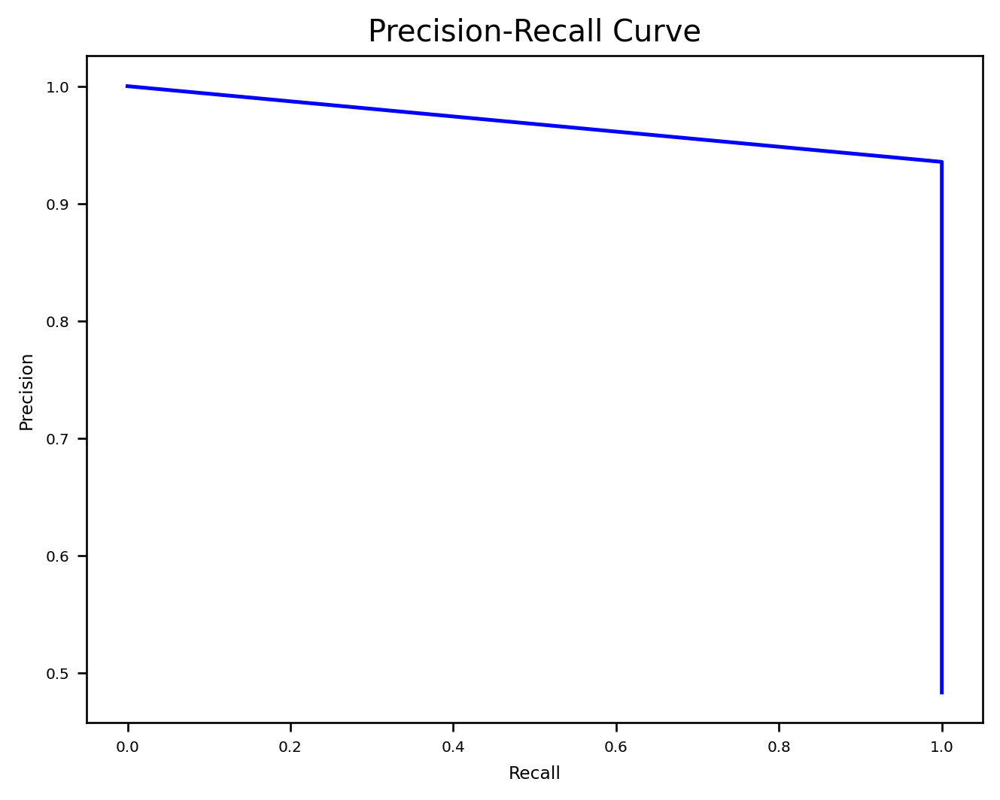

In [46]:
# Your code here
part2_main_classifier_test_score_list = []
x_train_whole = bigtrain_set.drop("label",axis=1)
y_train_whole = bigtrain_set["label"].copy()
model.fit(x_train_whole, y_train_whole)
y_test_pred = model.predict(x_test)

part2_main_classifier_test_score_list.append(baseline_mandr(y_test,y_test_pred,'SGD classifier'))

In [ ]:
# Your answers here

## 3. Decision Boundaries (15% = 4.5 marks)

### 3.1 Rank features [1 mark]

Although it is only possible to know the true usefulness of a feature when you've combined it with others in a machine learning method, it is still helpful to have some measure for how discriminative each feature is on its own.  One common method for doing this is to calculate a T-score (often used in statistics, and in the LDA machine learning method) for each feature.  

The formula for the T-score is (mean(x2) - mean(x1))/(0.5*(stddev(x2) + stddev(x1))), where x1 and x2 are the datasets corresponding to the two classes. Large values for the T-score (either positive or negative) indicate discriminative ability.

**Calculate the T-score for each feature and print out the best 4 features according to this score.**

In [53]:
# Your code here
dataset_positive = data.where(data['label'] == 1).dropna()
dataset_negative = data.where(data['label'] == 0).dropna()
dataset_negative.drop('label',axis=1,inplace=True)
dataset_positive.drop('label',axis=1,inplace=True)
dataset_positive.shape, dataset_negative.shape


((146, 30), (154, 30))

In [54]:
def t_score(x1,x2):
    return (x1.mean() - x2.mean())/(0.5*(x1.std() + x2.std()))

t_score_score = []
for feature in features:
    _t_score = t_score(dataset_positive[feature],dataset_negative[feature])
    t_score_score.append({
        'feature': feature,
        't_score': _t_score
    })

t_score_score.sort( key=lambda k: np.abs(k['t_score']), reverse=True)

for f in t_score_score:
    print(f'{f["feature"]} : t_score = {f["t_score"]}')

worst concave points : t_score = 2.4871607332953354
worst perimeter : t_score = 2.473073212650544
worst radius : t_score = 2.4108393809617583
mean concave points : t_score = 2.229435693128837
worst area : t_score = 2.226871351928768
mean perimeter : t_score = 2.0823044808776925
mean radius : t_score = 2.0031836227577884
mean area : t_score = 1.922528738419482
mean concavity : t_score = 1.6087855066521726
worst concavity : t_score = 1.5858755353974208
worst compactness : t_score = 1.4985867595165305
mean compactness : t_score = 1.4255721566309447
area error : t_score = 1.4055110522365544
perimeter error : t_score = 1.2986045010645577
radius error : t_score = 1.276429895728934
worst texture : t_score = 1.1852547525346322
mean texture : t_score = 1.0858009018741221
worst smoothness : t_score = 0.9666197403942813
worst symmetry : t_score = 0.9517608171723297
worst fractal dimension : t_score = 0.7594656102681975
mean smoothness : t_score = 0.7424559355220723
concave points error : t_score 

In [55]:
print('top 4 features by tscore')
for f in t_score_score[:4]:
    print(f'{f["feature"]} : : t_score =  {f["t_score"]}')

top 4 features by tscore
worst concave points : : t_score =  2.4871607332953354
worst perimeter : : t_score =  2.473073212650544
worst radius : : t_score =  2.4108393809617583
mean concave points : : t_score =  2.229435693128837


### 3.2 Visualise decision boundaries [2.5 marks]

**Display the decision boundaries** for each pair of features from the best 4 chosen above.  You can use the DecisionBoundaryDisplay function (as per workshop 6).

In [56]:
# Your code here
def make_meshgrid(x, y, ns=100):
   
    x_min, x_max = x.min(), x.max()
    y_min, y_max = y.min(), y.max()
    hx = (x_max - x_min)/ns
    hy = (y_max - y_min)/ns
    xx, yy = np.meshgrid(np.arange(x_min, x_max + hx, hx), np.arange(y_min, y_max + hy, hy))
    return xx, yy

In [57]:
def plot_contours(clf, xx, yy, xmean, n1, n2, **params):

   
    fullx = np.ones((xx.ravel().shape[0],1)) * np.reshape(xmean,(1,-1))
    fullx[:,n1] = xx.ravel()
    fullx[:,n2] = yy.ravel()
    Z = clf.predict(fullx)
    Z = Z.reshape(xx.shape)
    out = plt.contourf(xx, yy, Z, **params)
    return out

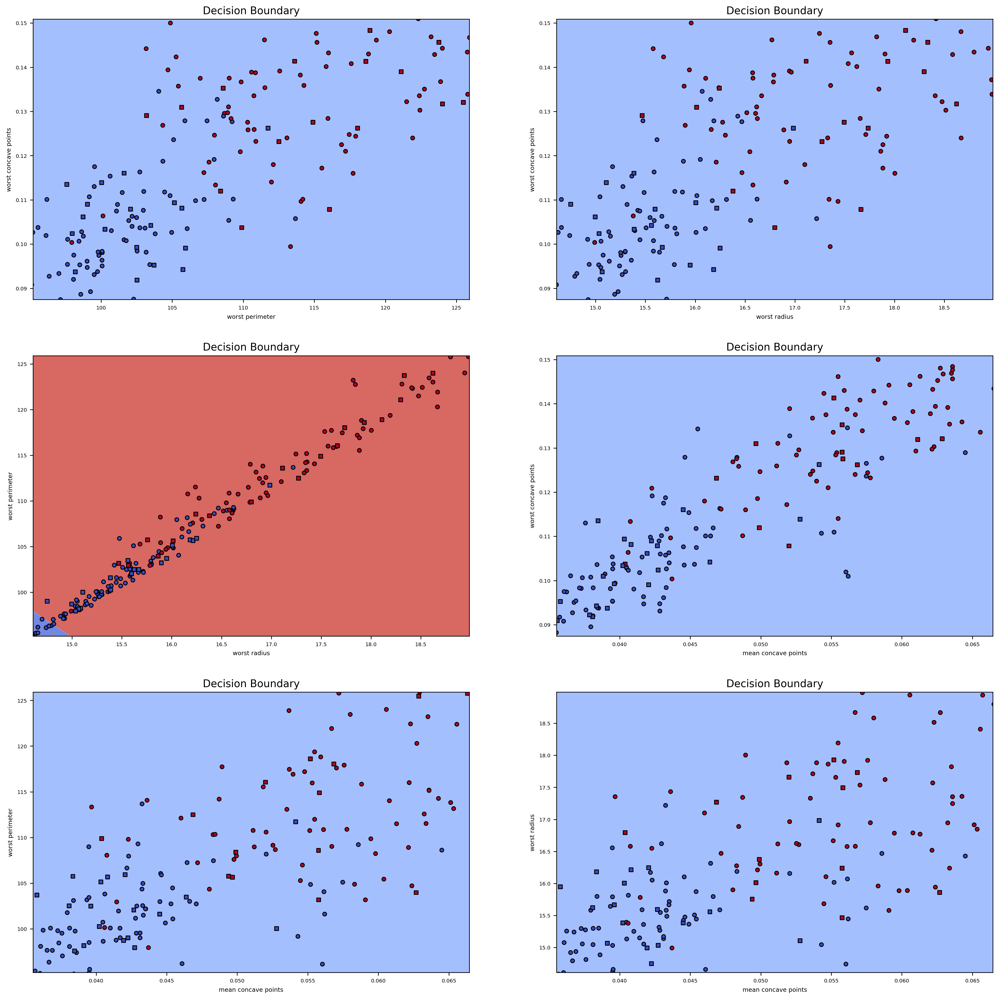

In [58]:
def make_x_mean(x1,x2):
    return 0.5* (np.mean(x1,axis=0) + np.mean(x2,axis=0))

feature_names = [f['feature'] for f in t_score_score[:4]]

fig=plt.figure(figsize=(20,20))
sgd_cv.best_estimator_.fit(x_train_whole.values,y_train_whole.values)
x_train_local = x_train.copy().values
x_valid_local = x_val.copy().values

x_mean = make_x_mean(dataset_pos.values,dataset_neg.values)

def decision_boundary(feature_one, feature_two):

    n0 = x_train.columns.get_loc(feature_one)
    n1 = x_train.columns.get_loc(feature_two)


    x10, x90 = np.percentile(x_train_local[:,n0],[10,90])
    y10, y90 = np.percentile(x_train_local[:,n1],[10,90])
    xx, yy = make_meshgrid(np.array([x10, x90]), np.array([y10, y90]), 500)

    plot_contours(sgd_cv.best_estimator_, xx, yy, x_mean, n0, n1, cmap=plt.cm.coolwarm, alpha=0.8)

    plt.scatter(x_train_local[:,n0], x_train_local[:,n1], c=y_train.values, cmap=plt.cm.coolwarm, s=20, edgecolors="k")

    plt.scatter(x_valid_local[:,n0], x_valid_local[:,n1], c=y_val.values, cmap=plt.cm.coolwarm, s=20, edgecolors="k", marker='s')

    plt.xlim(xx.min(), xx.max())
    plt.ylim(yy.min(), yy.max())
    plt.xlabel(f"Feature {feature_one}")
    plt.ylabel(f"Feature {feature_two}")
    plt.title("Decision Boundary")



count = 0
for i in range(4):
    for j in range(4):
        if (i > j):
            ax=fig.add_subplot(3,2,count+1)
            decision_boundary(feature_names[i],feature_names[j])
            plt.xlabel(feature_names[i])
            plt.ylabel(feature_names[j])
        else:
            count = count-1
        count = count+1
plt.show()

### 3.3 Interpretation [1 mark]

From the decision boundaries displayed above, **would you expect the method to extrapolate well or not**?  Give reasons for your answer.

In [ ]:
# Your answer here
# The area of a problem space in which a classifier's output label is ambiguous is referred to as a decision boundary. The classification problem is linear and the classes are linearly separable if the decision surface is a hyperplane. The lines separating decisions are not always distinct.According to the above diagram, the decision boundary divides the forecast into blue and red regions, and the ground truth is represented by a dot. The findings demonstrate that my chosen model, an SGD classifier, extrapolates effectively for these issues with manageable errors.

## 4. Second Round (15% = 4.5 marks)

After presenting your initial results to the client they come back to you and say that they have done some financial analysis and it would save them a lot of time and money if they did not have to analyse every cell, which is needed to get the "worst" features. Instead, they can quickly get accurate estimates for the "mean" and "standard error" features from a much smaller, randomly selected set of cells.

They ask you to **give them a performance estimate for the same problem, but without using any of the "worst" features.**



### 4.1 New estimate [3.5 marks]

**Calculate an unbiased performance estimate** for this new problem, as requested by the client.

In [59]:
# Your code here
small_data = data.copy()
small_data = small_data[small_data.columns.drop(list(small_data.filter(regex='worst')))]
small_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 21 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   label                    300 non-null    int64  
 1   mean radius              300 non-null    float64
 2   mean texture             300 non-null    float64
 3   mean perimeter           300 non-null    float64
 4   mean area                300 non-null    float64
 5   mean smoothness          300 non-null    float64
 6   mean compactness         300 non-null    float64
 7   mean concavity           300 non-null    float64
 8   mean concave points      300 non-null    float64
 9   mean symmetry            300 non-null    float64
 10  mean fractal dimension   300 non-null    float64
 11  radius error             300 non-null    float64
 12  texture error            300 non-null    float64
 13  perimeter error          300 non-null    float64
 14  area error               3

In [61]:
bigtrain_set, test_set = train_test_split(small_data, test_size=0.2, random_state=42, stratify=data['label'])
train_set, val_set = train_test_split(bigtrain_set, test_size=0.2, random_state=42, stratify=bigtrain_set['label'])

In [62]:
# Verify the size and label distribution in each dataset.
X_train = train_set.drop("label",axis=1)
y_train = train_set["label"].copy()
X_test = test_set.drop("label",axis=1)
y_test = test_set["label"].copy()
X_val = val_set.drop("label",axis=1)
y_val = val_set["label"].copy()

print(f'Shapes are {[X_train.shape,y_train.shape,X_test.shape,y_test.shape,X_val.shape,y_val.shape]}')
print(np.mean(y_train),np.mean(y_test),np.mean(y_val))

Shapes are [(192, 20), (192,), (60, 20), (60,), (48, 20), (48,)]
0.4895833333333333 0.48333333333333334 0.4791666666666667


In [65]:
sgd_base = Pipeline([ ('preproc',pre), ('sgd',SGDClassifier()) ])
sgd_base.fit(X_train,y_train)
y_val_pred = sgd_base.predict(X_val)
sgd_base

Pipeline(steps=[('preproc',
                 Pipeline(steps=[('imputer', SimpleImputer(strategy='median')),
                                 ('std_scaler', StandardScaler())])),
                ('sgd', SGDClassifier())])

-------- start SGD baseline --------

Starting report baseline and metrics for SGD baseline ...
Balanced accuracy: 0.9182608695652175
Recall: 0.9565217391304348
Precision: 0.88
AUC: 0.9182608695652175
F1 score: 0.9166666666666666
F01 score: 0.880697582243361
F10 score: 0.9556989247311827

-------- end SGD baseline --------


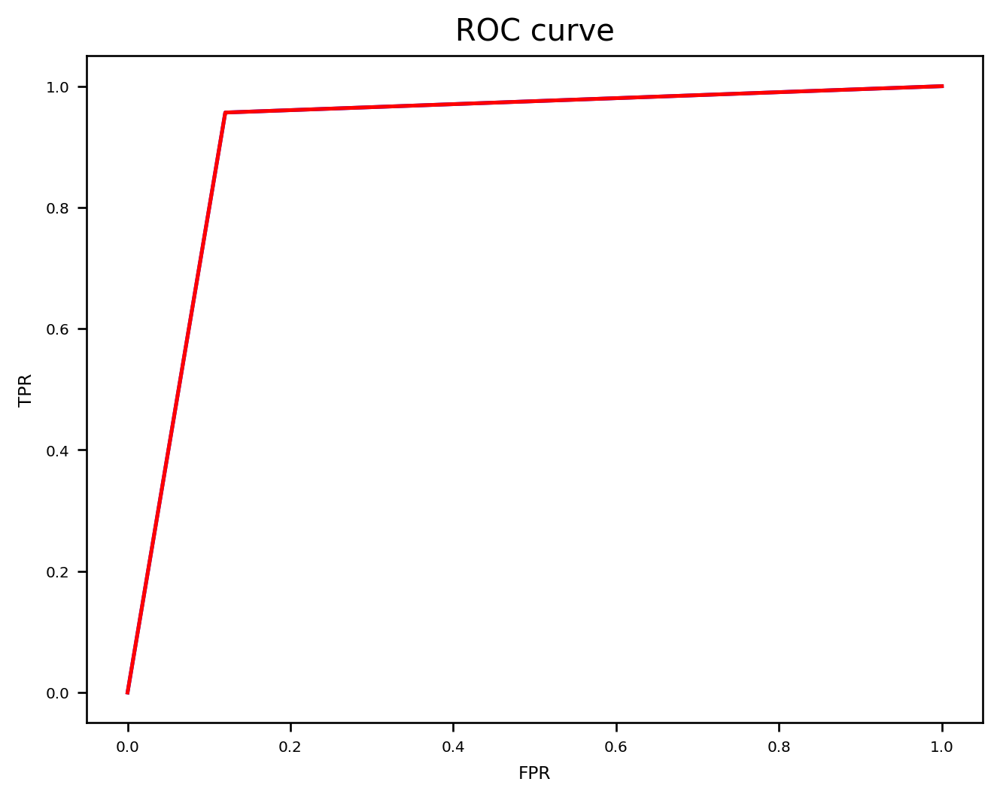

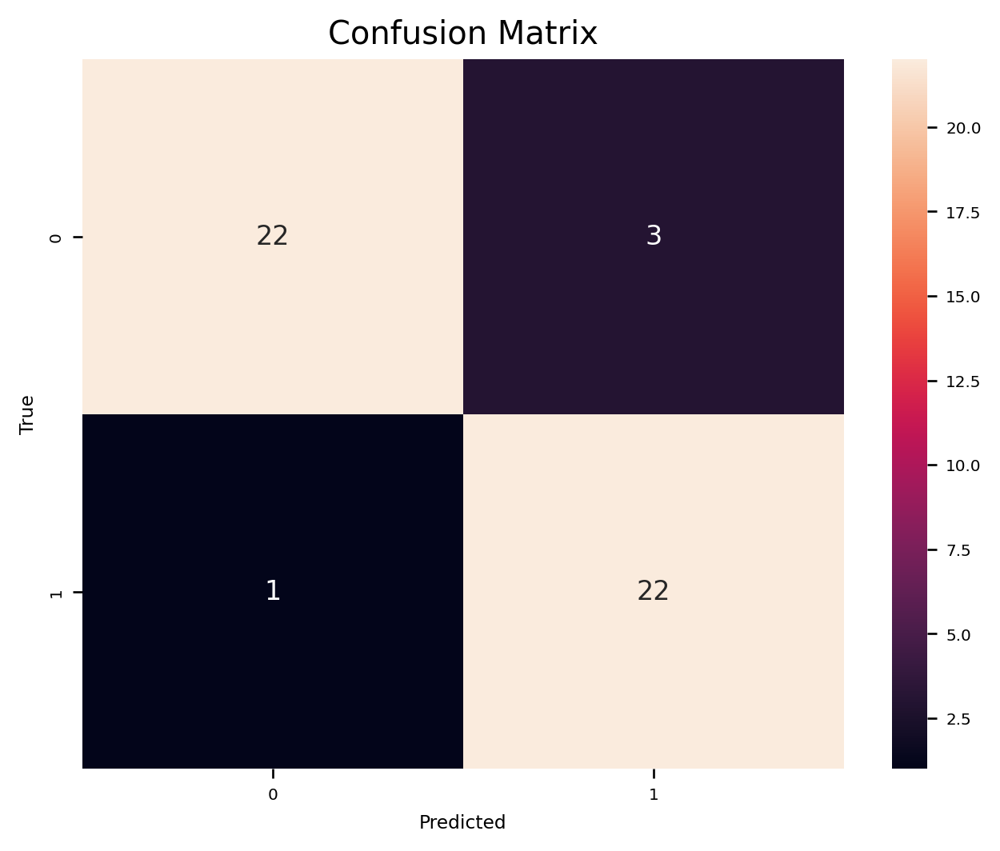

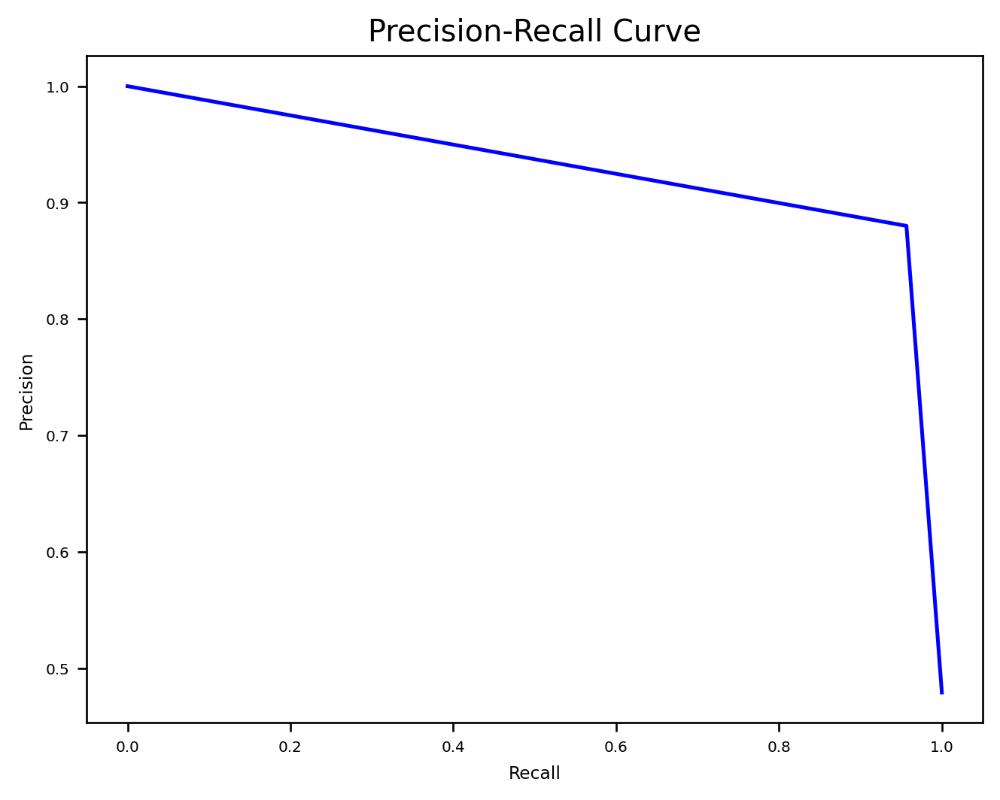

In [67]:
_ = baseline_mandr(y_val,y_val_pred,'SGD baseline')

In [68]:
# Your code here

knn_pl = Pipeline([ ('preproc',pre), ('knn',KNeighborsClassifier(n_neighbors=3))])

knn_params = dict(
    knn__n_neighbors=range(1,20),
    knn__weights=['uniform','distance'],
    knn__metric=['euclidean','manhattan','minkowski'],
    knn__algorithm=['auto','ball_tree','kd_tree','brute'],
    knn__p=range(1,20)
)


dt_pl = Pipeline([ ('preproc',pre), ('dt',DecisionTreeClassifier(random_state=42))])

dt_params = dict(
    dt__criterion=['gini','entropy'],
    dt__max_depth=range(1,20),
    dt__min_samples_split=range(2,20),
    dt__min_samples_leaf=range(1,20),
    dt__max_features=['auto','sqrt','log2'],
)

svc_pl = Pipeline([ ('preproc',pre), ('svc',SVC(random_state=42))])

svc_params = dict(
    svc__C=[0.001, 0.01, 0.1, 1, 10, 100, 1000, 6750],
    svc__kernel=['linear','rbf','poly','sigmoid'],
    svc__gamma=['scale', 'auto'],
)

sgd_pl = Pipeline([ ('preproc',pre), ('sgd',SGDClassifier(random_state=42)) ])

sgd_params = dict(
    sgd__loss=['hinge','log','modified_huber','perceptron'],
    sgd__penalty=['l2','l1','elasticnet'],
    sgd__alpha=[0.0001, 0.001, 0.01, 0.1, 1, 10, 100, 1000],
    sgd__learning_rate=['constant','optimal','invscaling','adaptive'],
    sgd__eta0=[0.0001, 0.001, 0.01, 0.1, 1, 10, 100, 1000]
)

scorer = make_scorer(fbeta_score,beta=2)

part4_main_classifier_score_list = list()

best_params_ : {'knn__algorithm': 'auto', 'knn__metric': 'manhattan', 'knn__n_neighbors': 4, 'knn__p': 1, 'knn__weights': 'distance'}
-------- start KNN classifier --------

Starting report baseline and metrics for KNN classifier ...
Balanced accuracy: 0.9565217391304348
Recall: 0.9130434782608695
Precision: 1.0
AUC: 0.9565217391304348
F1 score: 0.9545454545454545
F01 score: 0.999057936881771
F10 score: 0.9138302455837999

-------- end KNN classifier --------


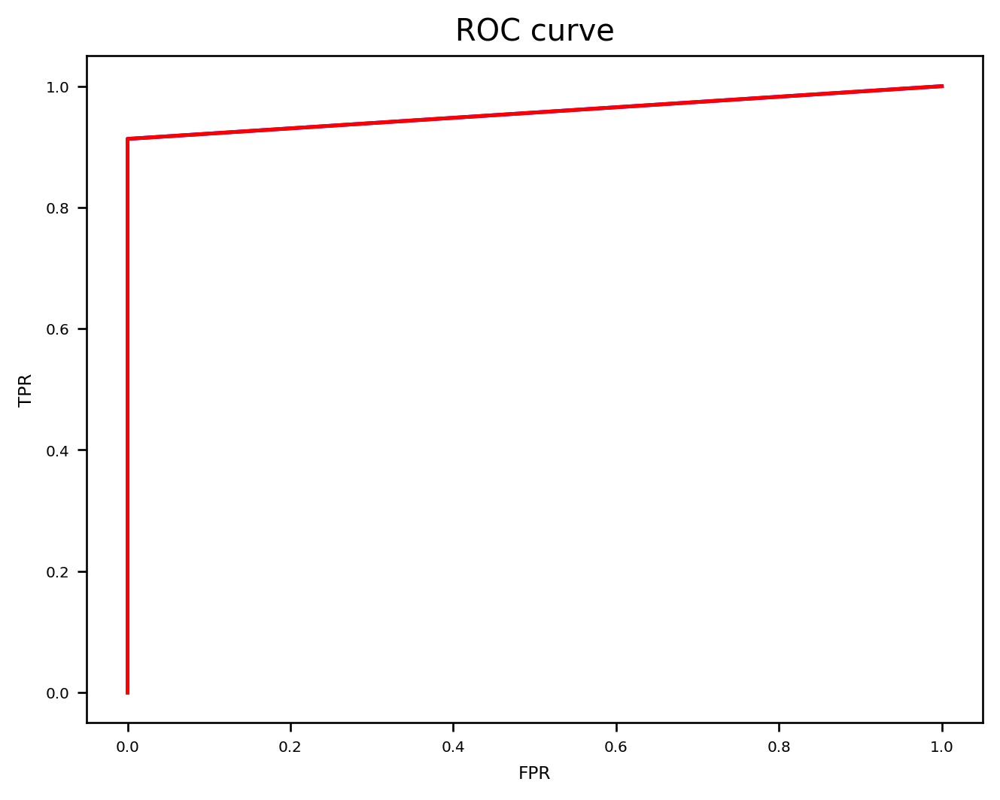

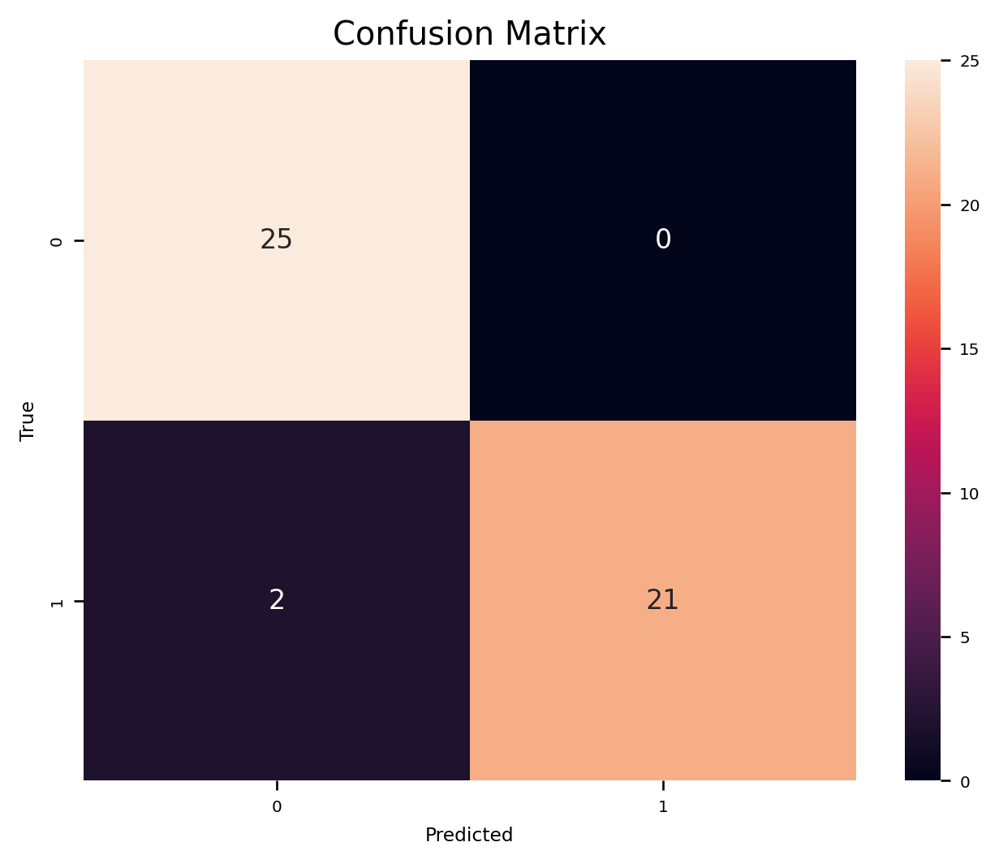

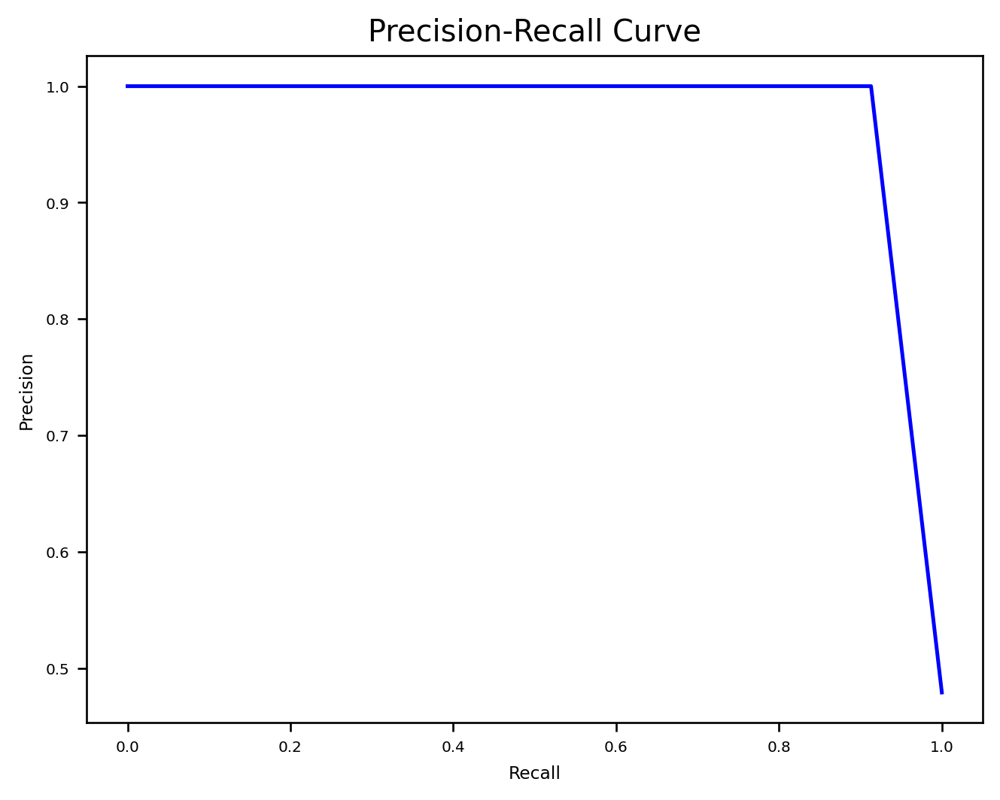

In [69]:
# knn_pl.fit(X_train,y_train)
knn_cv = GridSearchCV(knn_pl,knn_params,cv=5,n_jobs=-1,scoring=scorer,return_train_score=True).fit(X_train,y_train)

print(f'best_params_ : {knn_cv.best_params_}')

knn_cv.best_estimator_.fit(X_train,y_train)
y_val_pred = knn_cv.best_estimator_.predict(X_val)
part4_main_classifier_score_list.append(baseline_mandr(y_val,y_val_pred,'KNN classifier'))

C:\Users\chava\anaconda3\lib\site-packages\sklearn\tree\_classes.py:298: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
C:\Users\chava\anaconda3\lib\site-packages\sklearn\tree\_classes.py:298: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(


best_params_ : {'dt__criterion': 'entropy', 'dt__max_depth': 3, 'dt__max_features': 'auto', 'dt__min_samples_leaf': 1, 'dt__min_samples_split': 9}
-------- start Decision tree classifier --------

Starting report baseline and metrics for Decision tree classifier ...
Balanced accuracy: 0.8782608695652174
Recall: 0.9565217391304348
Precision: 0.8148148148148148
AUC: 0.8782608695652174
F1 score: 0.8800000000000001
F01 score: 0.8160117517443994
F10 score: 0.9548775247099268

-------- end Decision tree classifier --------


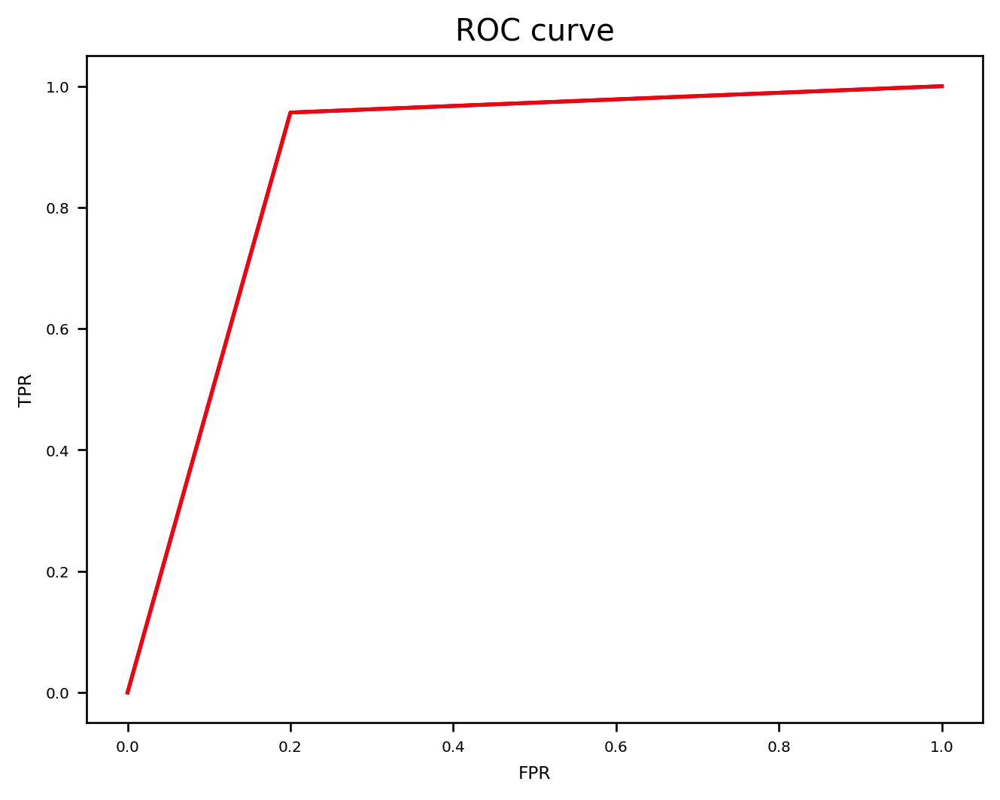

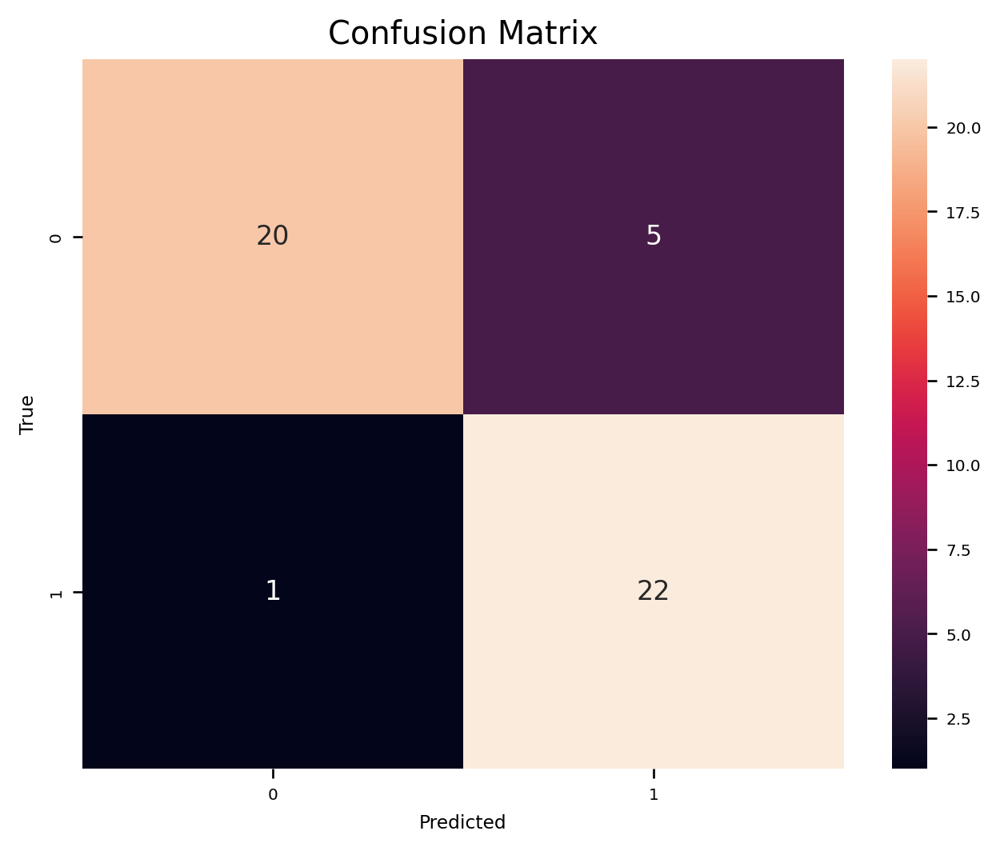

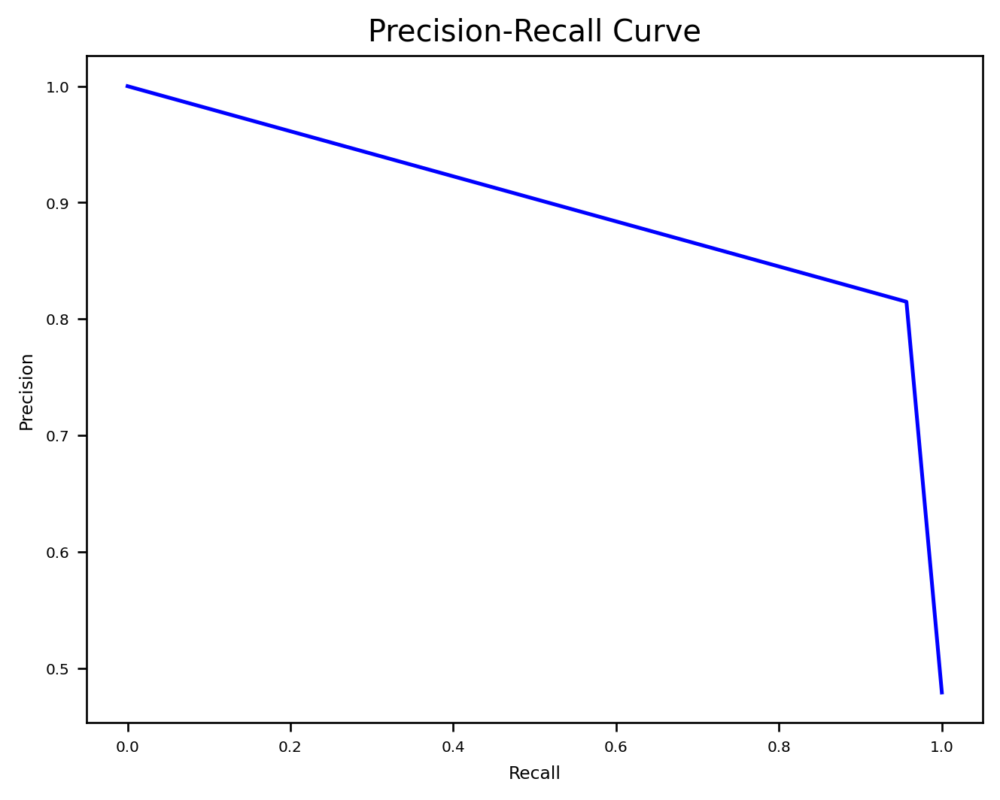

In [71]:
dt_cv = GridSearchCV(dt_pl,dt_params,cv=5,n_jobs=-1,scoring=scorer,return_train_score=True).fit(X_train,y_train)

print(f'best_params_ : {dt_cv.best_params_}')

dt_cv.best_estimator_.fit(X_train,y_train)
y_val_pred = dt_cv.best_estimator_.predict(X_val)
part4_main_classifier_score_list.append(baseline_mandr(y_val,y_val_pred,'Decision tree classifier'))

best_params_ : {'svc__C': 100, 'svc__gamma': 'scale', 'svc__kernel': 'rbf'}
-------- start Support vector machine classifier --------

Starting report baseline and metrics for Support vector machine classifier ...
Balanced accuracy: 0.9347826086956521
Recall: 0.8695652173913043
Precision: 1.0
AUC: 0.9347826086956521
F1 score: 0.9302325581395349
F01 score: 0.9985170538803757
F10 score: 0.8706896551724138

-------- end Support vector machine classifier --------


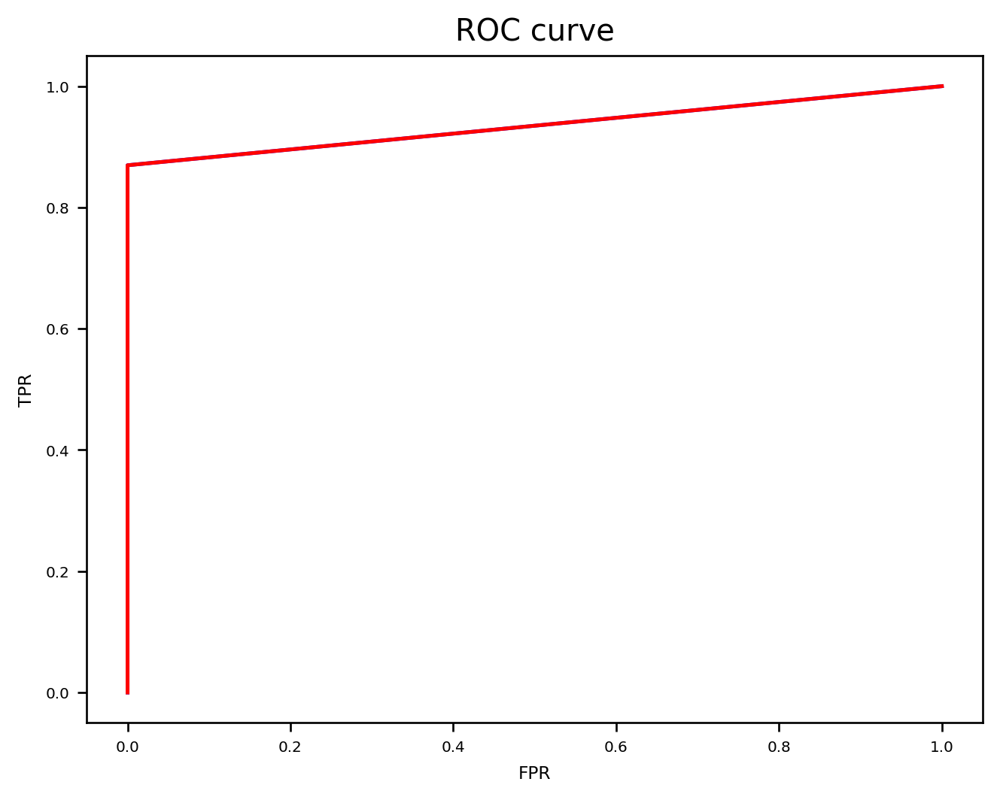

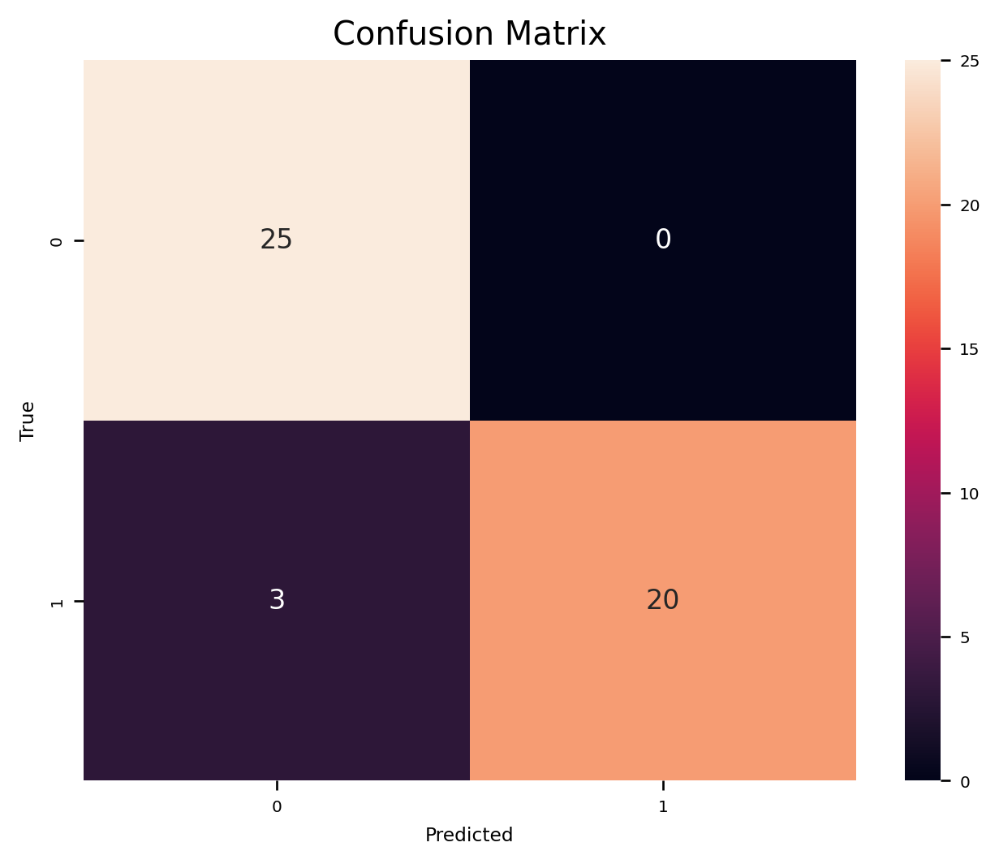

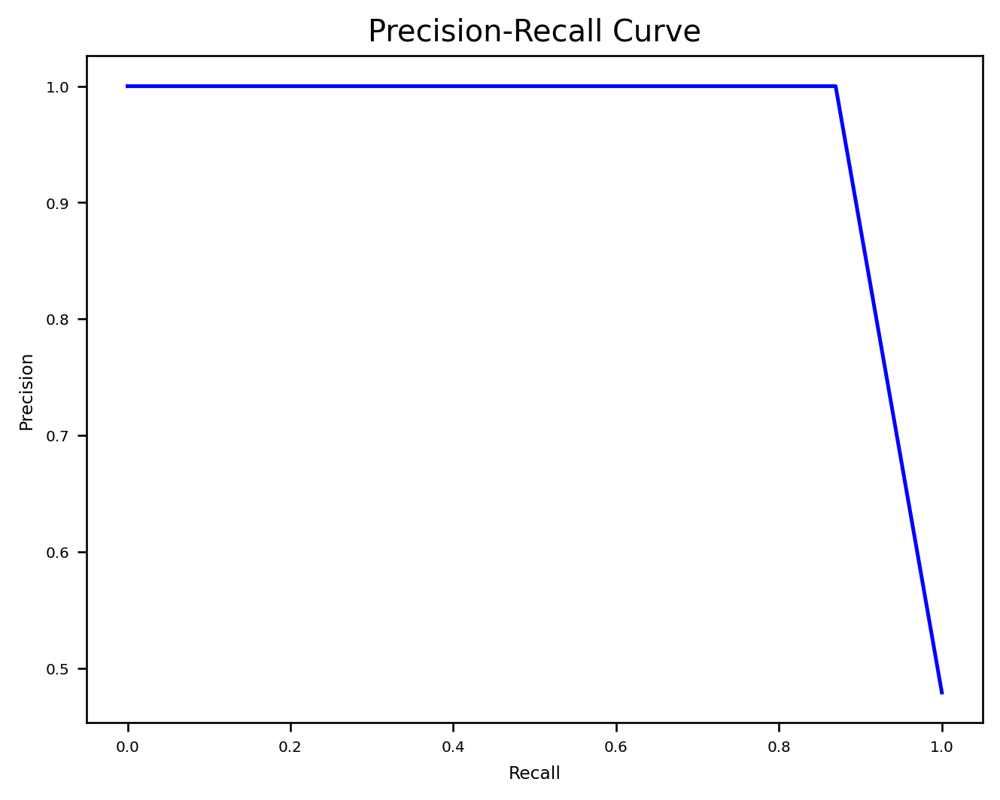

In [72]:
svc_cv = GridSearchCV(svc_pl,svc_params,cv=5,n_jobs=-1,scoring=scorer,error_score='raise',return_train_score=True).fit(X_train,y_train)

print(f'best_params_ : {svc_cv.best_params_}')

svc_cv.best_estimator_.fit(X_train,y_train)
y_val_pred = svc_cv.best_estimator_.predict(X_val)
part4_main_classifier_score_list.append(baseline_mandr(y_val,y_val_pred,'Support vector machine classifier'))

best_params_ : {'sgd__alpha': 0.1, 'sgd__eta0': 0.1, 'sgd__learning_rate': 'invscaling', 'sgd__loss': 'perceptron', 'sgd__penalty': 'l2'}
-------- start SGD classifier --------

Starting report baseline and metrics for SGD classifier ...
Balanced accuracy: 0.9165217391304348
Recall: 0.9130434782608695
Precision: 0.9130434782608695
AUC: 0.9165217391304349
F1 score: 0.9130434782608695
F01 score: 0.9130434782608695
F10 score: 0.9130434782608694

-------- end SGD classifier --------


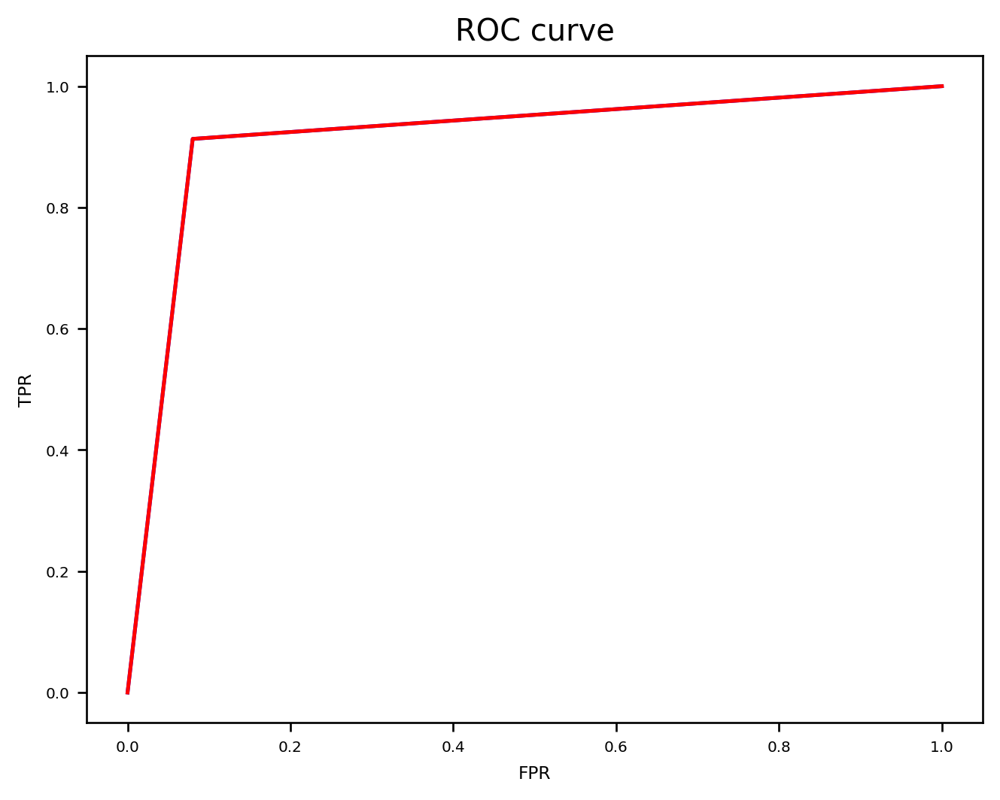

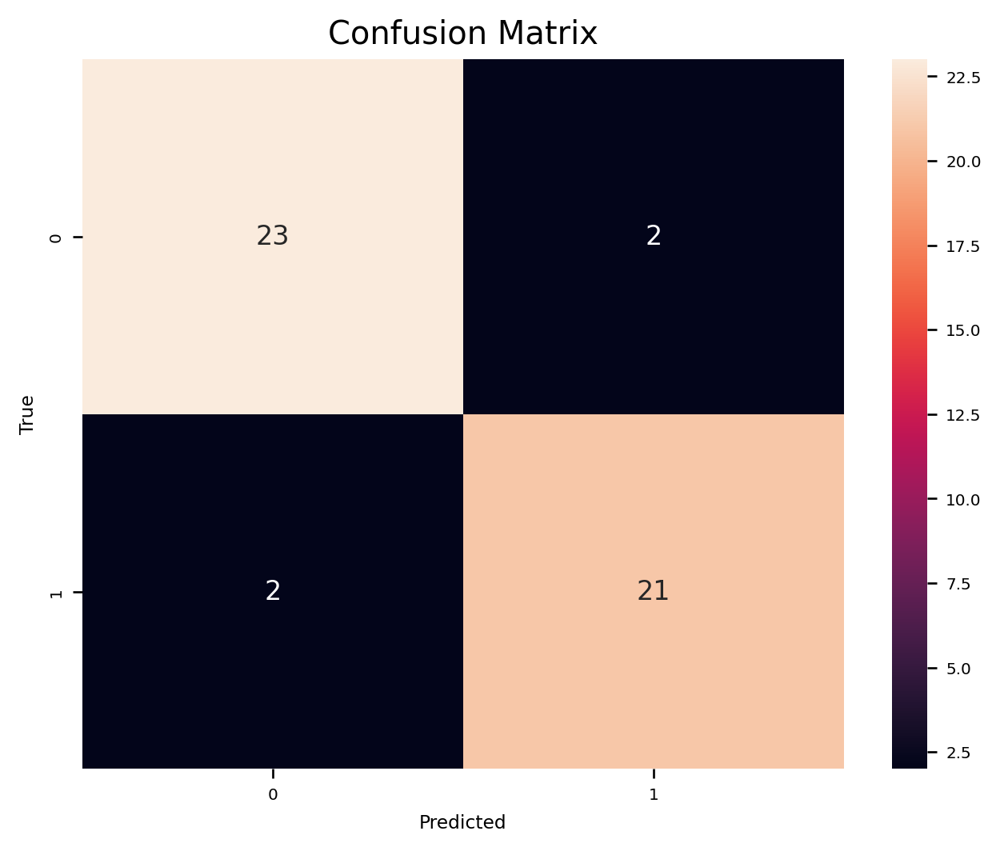

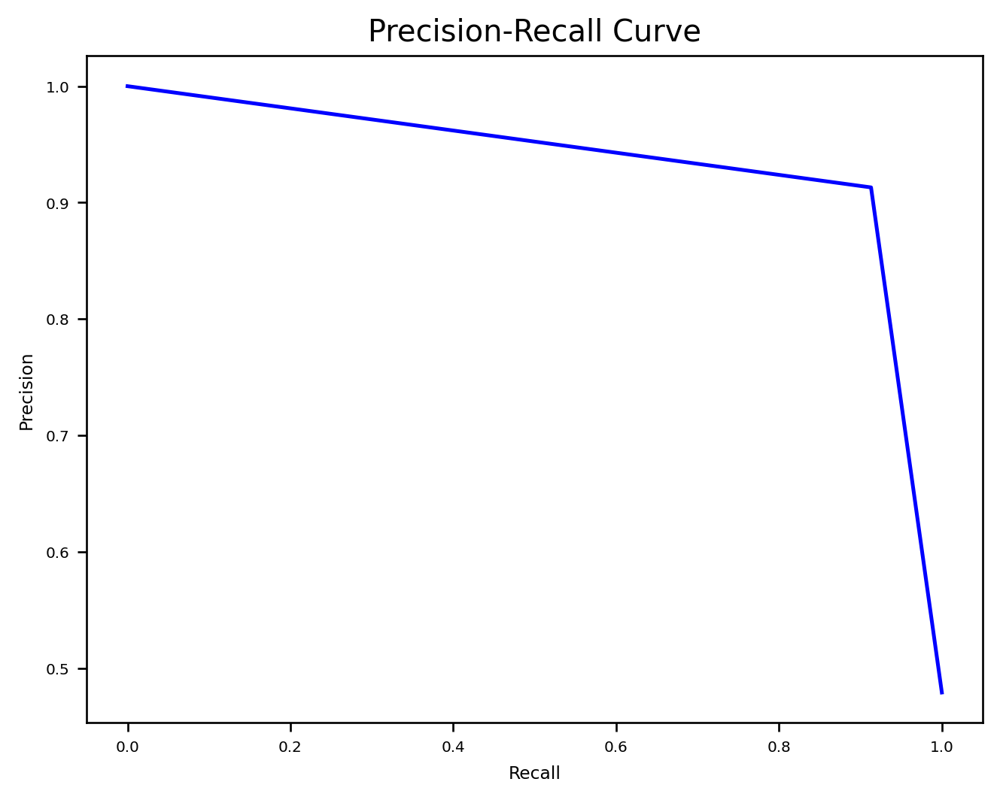

In [73]:

sgd_cv = GridSearchCV(sgd_pl,sgd_params,cv=5,n_jobs=-1,scoring=scorer,error_score='raise',return_train_score=True).fit(X_train,y_train)

print(f'best_params_ : {sgd_cv.best_params_}')

y_val_pred = sgd_cv.best_estimator_.predict(X_val)
part4_main_classifier_score_list.append(baseline_mandr(y_val,y_val_pred,'SGD classifier'))

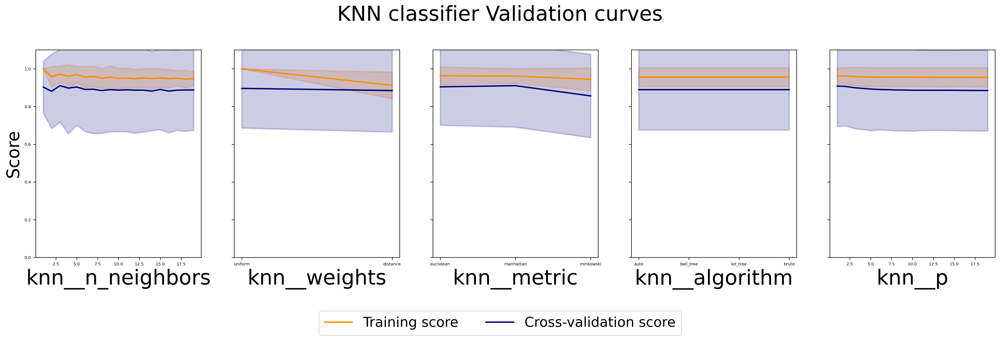

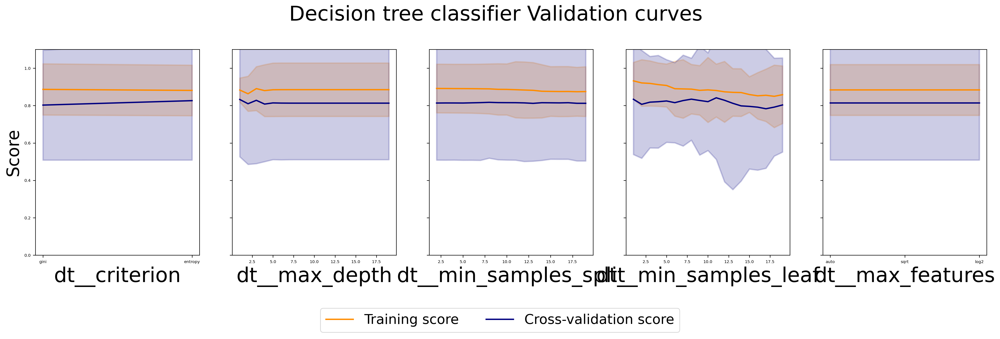

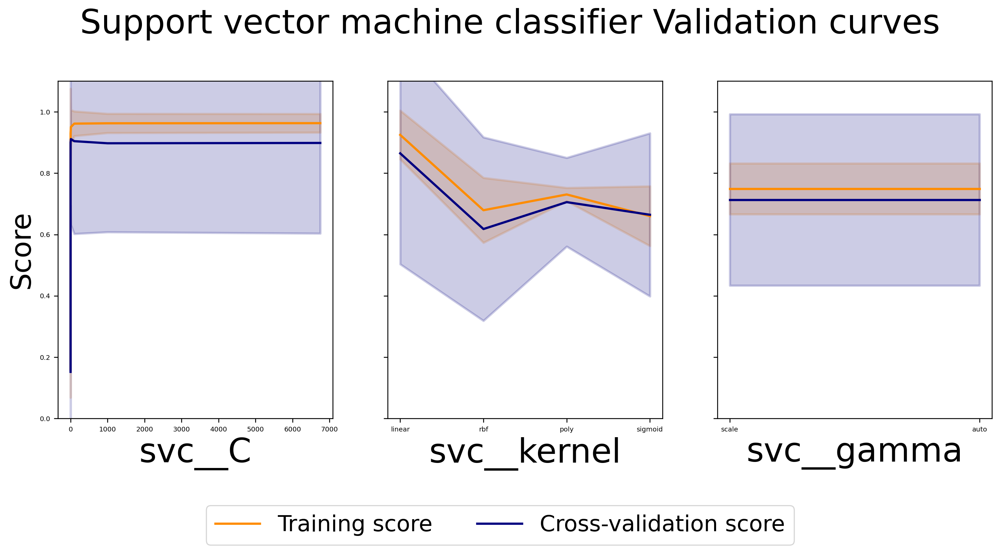

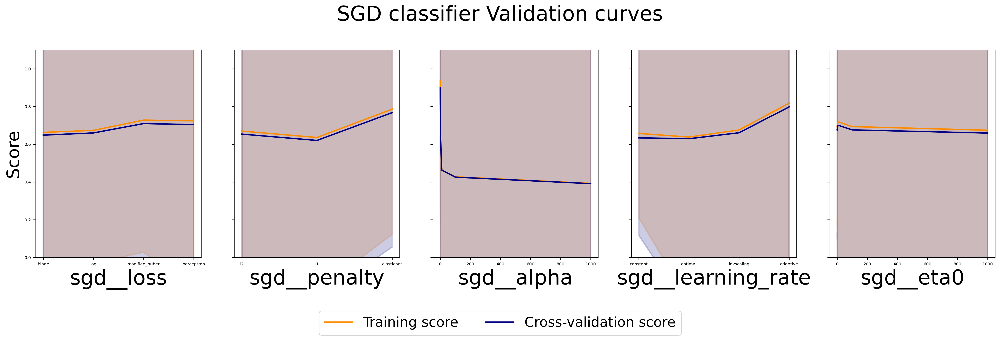

In [78]:
plot_grid(knn_cv.cv_results_,knn_params,"KNN classifier")
plot_grid(dt_cv.cv_results_,dt_params,"Decision tree classifier")
plot_grid(svc_cv.cv_results_,svc_params,"Support vector machine classifier")
plot_grid(sgd_cv.cv_results_,sgd_params,"SGD classifier")

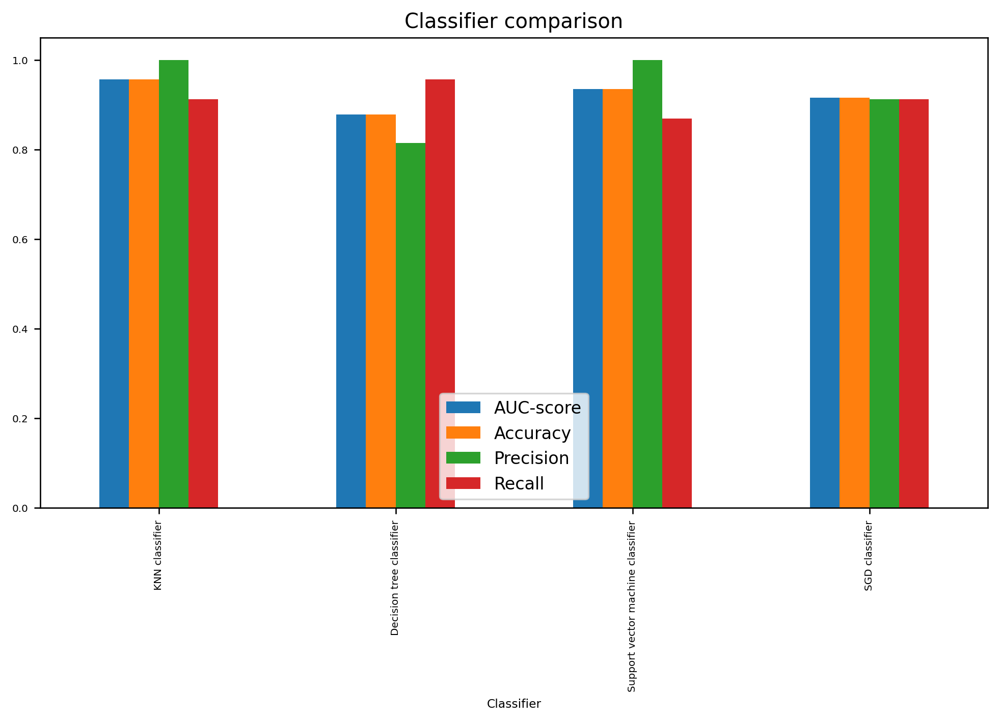

                          Classifier  AUC-score  Accuracy  Precision    Recall
0                     KNN classifier   0.956522  0.956522   1.000000  0.913043
1           Decision tree classifier   0.878261  0.878261   0.814815  0.956522
2  Support vector machine classifier   0.934783  0.934783   1.000000  0.869565
3                     SGD classifier   0.916522  0.916522   0.913043  0.913043


In [79]:
plot_compare_classifier_score(part4_main_classifier_score_list)

-------- start KNN classifier Final --------

Starting report baseline and metrics for KNN classifier Final ...
Balanced accuracy: 0.9332591768631813
Recall: 0.9310344827586207
Precision: 0.9310344827586207
AUC: 0.9332591768631813
F1 score: 0.9310344827586207
F01 score: 0.9310344827586207
F10 score: 0.9310344827586207

-------- end KNN classifier Final --------


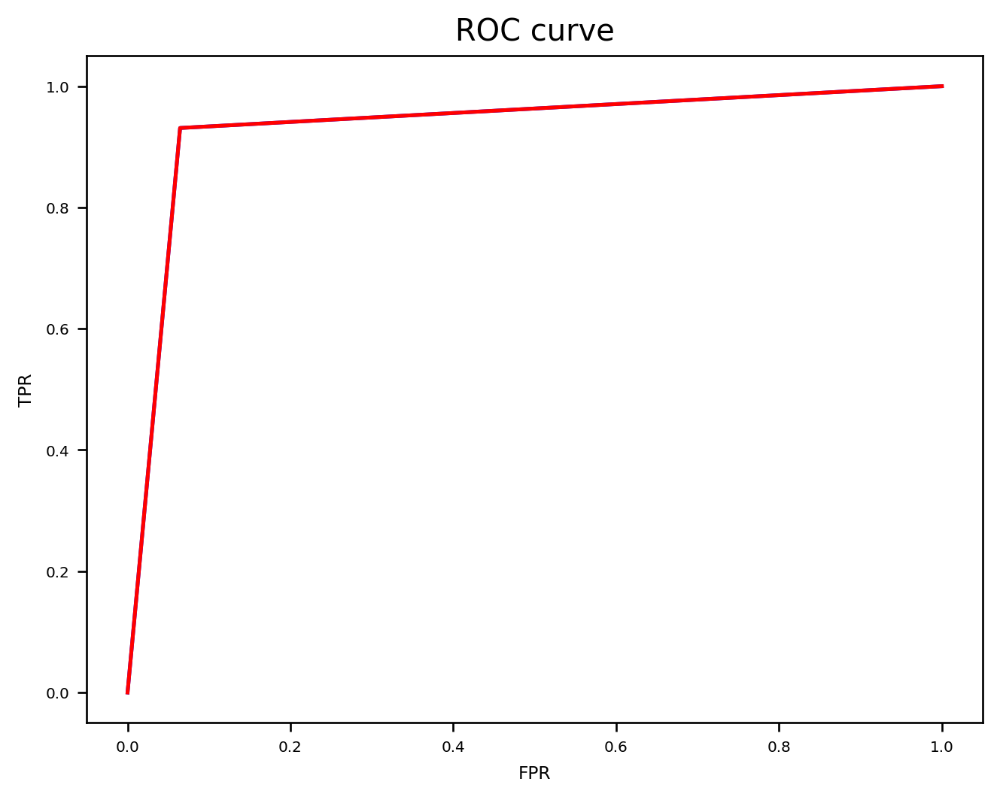

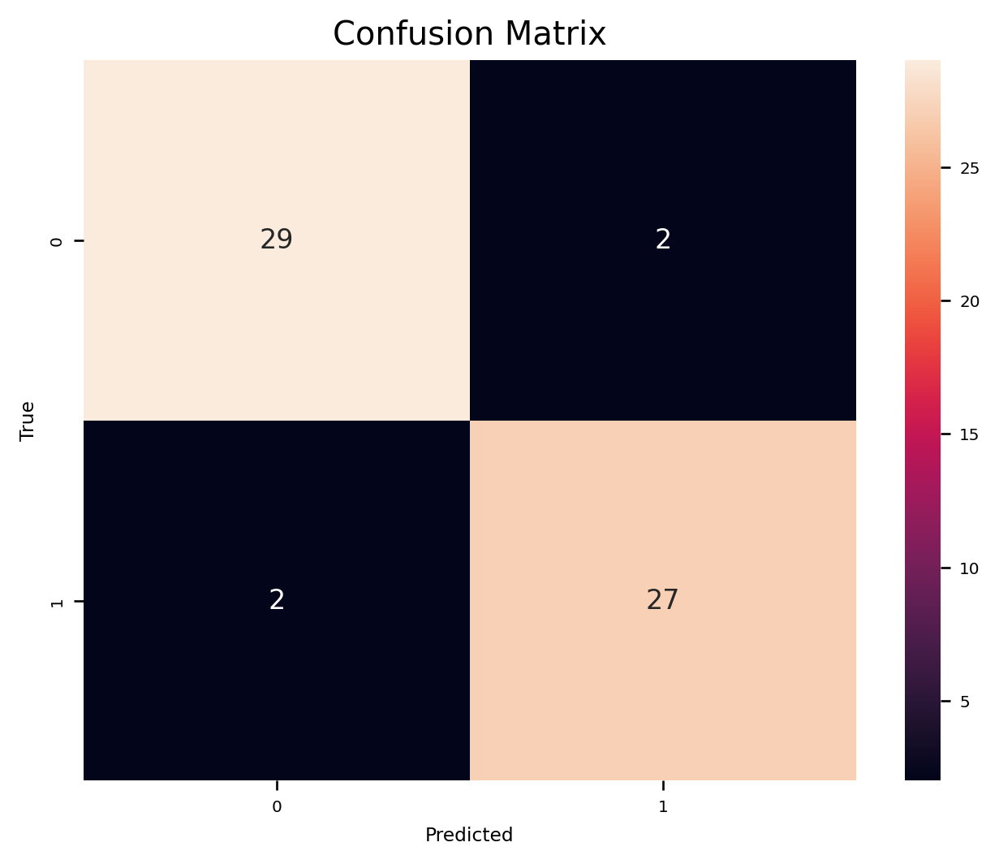

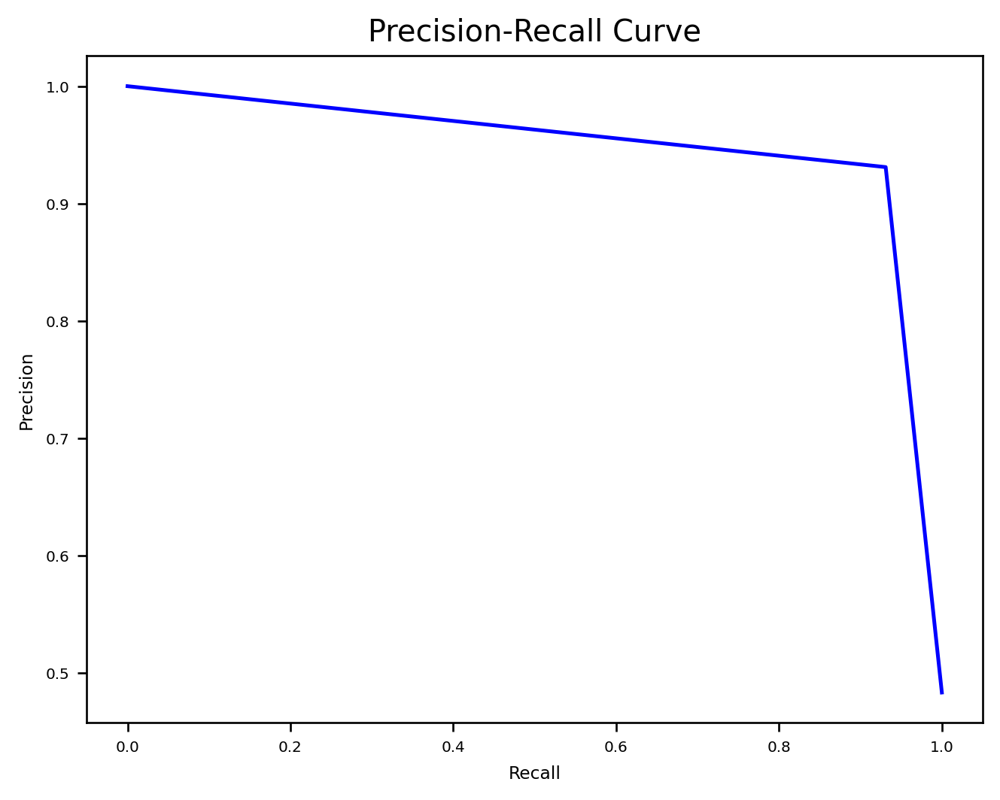

In [80]:
X_train_whole = bigtrain_set.drop("label",axis=1)
y_train_whole = bigtrain_set["label"].copy()
model = knn_cv.best_estimator_
model.fit(X_train_whole, y_train_whole)
y_test_pred = model.predict(X_test)

_ = baseline_mandr(y_test,y_test_pred,'KNN classifier Final')

# 4.2 Performance difference [1 mark]

Do you think the new classifier, that does not use the "worst" features, is:
 - **as good as the previous classifier** (that uses all the features)
 - **better than the previous classifier**
 - **worse than the previous classifier**
 
Give reasons for your answer.

In [ ]:
#Your answers here
#i. The KNN, DT, and SGD classifiers have an AUC-score of over 90%, according to the performance evaluation numbers above. However, based on the KNN and DT validation curve, the blue solid line is marginally lower than the orange solid line . This may be a sign of overfitting in the future, but more variations must be taken into account because the dataset size for training and cross validation is relatively small.
#ii. In accordance with the machine learning tenet, a decent model and weights should be able to predict any unknown data with tolerable accuracy. The KNN classifier has a lower training/validation gap than the decision tree classifier, indicating that SGD classifier performance is more consistent and that SGD classifier scores substantially higher for unobserved data .
#iii. The KNN classifier has metrics for both accuracy and recall that are generally balanced.
#iv. In comparison to the prior classifier, the accuracy and recall have significantly fallen, and they now have 93% recall, which does not meet one of the customer needs to have at least a 95% probability of recognizing malignant cancer when it is present.
#v. As a result, the trade-off between financial expense and classifier acceptance must be taken into account.


In [ ]:
# Your answer here